# Name: Lim Chen Hao

In [1]:
# check the total time to run entire jupyter notebook -> Approx 55 mins
import timeit
start_time = timeit.default_timer()


# DSA5102_Final Project_EDA and Machine Learning (Part 2)

**This is the second notebook**, mainly on exploratary data analysis and Machine Learning (supervised and unsupervised).

Over here, I will be importing **2 same but slightly different copies of dataset here** (cleaned version from my first jupyter notebook)

Both are created from previous jupyter notebook after data cleaning.

1. 'salaries_ori' dataset (26894 rows × 28 columns): 
    * exclude one-hot encoded data
    * for Unsupervised leaning


2. 'salaries' dataset (26894 rows × 560 columns):
    * include of one-hot encoded data
    * for supervised leaning 

In [2]:
# Import numpy
import numpy as np
from numpy import arange
from numpy import mean
from numpy import std
from numpy import absolute

# Import pandas
import pandas as pd
import requests
import seaborn as sns

# Import datetime modules
from datetime import datetime, timedelta
from time import time

# Import plotting tools
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('seaborn-whitegrid')

# Import scipy
from scipy.stats import norm

# Import models from scikit-learn

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.linear_model import RidgeCV
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from scipy.stats import norm

from sklearn import tree
from sklearn.tree import export_text
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

## Import csv files (cleaned version from my first jupyter notebook)

In [3]:
salaries_ori = pd.read_csv('salaries_clean.csv')
salaries = pd.read_csv('salaries_clean_encode.csv')
salaries

,timestamp,company,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,...,title_Marketing,title_Mechanical Engineer,title_Product Designer,title_Product Manager,title_Recruiter,title_Sales,title_Software Engineer,title_Software Engineering Manager,title_Solution Architect,title_Technical Program Manager
0,2019-10-29 16:04:25,Zillow,Software Engineer,242.0,"San Francisco, CA",8.0,1.0,187.0,40.0,15.0,...,0,0,0,0,0,0,1,0,0,0
1,2019-10-29 17:40:50,Amazon,Software Engineer,172.0,"Seattle, WA",5.0,0.0,135.0,12.0,25.0,...,0,0,0,0,0,0,1,0,0,0
2,2019-10-29 18:43:36,Zillow,Software Engineer,255.0,"Seattle, WA",5.0,0.0,165.0,45.0,45.0,...,0,0,0,0,0,0,1,0,0,0
3,2019-10-29 20:40:02,Amazon,Software Engineer,144.0,"Seattle, WA",0.0,0.0,112.0,12.0,20.0,...,0,0,0,0,0,0,1,0,0,0
4,2019-10-29 21:07:59,Google,Software Engineer,515.0,"Sunnyvale, CA",15.0,0.0,220.0,203.0,92.0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26889,2021-08-17 05:38:26,Bytedance,Software Engineer,77.0,"Singapore, SG, Singapore",0.0,0.0,62.0,0.0,15.0,...,0,0,0,0,0,0,1,0,0,0
26890,2021-08-17 06:47:07,Ncr,Software Engineer,92.0,"Atlanta, GA",2.0,2.0,92.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
26891,2021-08-17 08:16:36,Amazon,Product Manager,241.0,"Seattle, WA",9.0,0.0,150.0,46.0,45.0,...,0,0,0,1,0,0,0,0,0,0
26892,2021-08-17 08:22:17,Fidelity Investments,Software Engineer,98.0,"Durham, NC",0.0,0.0,85.0,0.0,13.0,...,0,0,0,0,0,0,1,0,0,0


In [4]:
salaries_ori

,timestamp,company,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,...,month,week,day,hour,Education_ordinal,gender_nominal,Race_nominal,titleLabel,areaLabel,companyLabel
0,2019-10-29 16:04:25,Zillow,Software Engineer,242.0,"San Francisco, CA",8.0,1.0,187.0,40.0,15.0,...,10,44,29,16,2,0,8,11,107,355
1,2019-10-29 17:40:50,Amazon,Software Engineer,172.0,"Seattle, WA",5.0,0.0,135.0,12.0,25.0,...,10,44,29,17,1,0,8,11,115,10
2,2019-10-29 18:43:36,Zillow,Software Engineer,255.0,"Seattle, WA",5.0,0.0,165.0,45.0,45.0,...,10,44,29,18,2,0,8,11,115,355
3,2019-10-29 20:40:02,Amazon,Software Engineer,144.0,"Seattle, WA",0.0,0.0,112.0,12.0,20.0,...,10,44,29,20,2,0,8,11,115,10
4,2019-10-29 21:07:59,Google,Software Engineer,515.0,"Sunnyvale, CA",15.0,0.0,220.0,203.0,92.0,...,10,44,29,21,1,0,8,11,122,149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26889,2021-08-17 05:38:26,Bytedance,Software Engineer,77.0,"Singapore, SG, Singapore",0.0,0.0,62.0,0.0,15.0,...,8,33,17,5,3,0,1,11,116,61
26890,2021-08-17 06:47:07,Ncr,Software Engineer,92.0,"Atlanta, GA",2.0,2.0,92.0,0.0,0.0,...,8,33,17,6,3,0,1,11,2,215
26891,2021-08-17 08:16:36,Amazon,Product Manager,241.0,"Seattle, WA",9.0,0.0,150.0,46.0,45.0,...,8,33,17,8,3,1,1,8,115,10
26892,2021-08-17 08:22:17,Fidelity Investments,Software Engineer,98.0,"Durham, NC",0.0,0.0,85.0,0.0,13.0,...,8,33,17,8,5,0,5,11,32,131


In [5]:
# Check for null values - no null values (cleaned from earlier notebook)
salaries_ori[salaries_ori.isnull() == True].sum()

timestamp                    0
company                      0
title                        0
totalyearlycompensation    0.0
location                     0
yearsofexperience          0.0
yearsatcompany             0.0
basesalary                 0.0
stockgrantvalue            0.0
bonus                      0.0
gender                       0
Education                    0
Race                         0
state_name                   0
state                        0
country                      0
area                         0
year                       0.0
month                      0.0
week                       0.0
day                        0.0
hour                       0.0
Education_ordinal          0.0
gender_nominal             0.0
Race_nominal               0.0
titleLabel                 0.0
areaLabel                  0.0
companyLabel               0.0
dtype: object

In [6]:
salaries

,timestamp,company,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,...,title_Marketing,title_Mechanical Engineer,title_Product Designer,title_Product Manager,title_Recruiter,title_Sales,title_Software Engineer,title_Software Engineering Manager,title_Solution Architect,title_Technical Program Manager
0,2019-10-29 16:04:25,Zillow,Software Engineer,242.0,"San Francisco, CA",8.0,1.0,187.0,40.0,15.0,...,0,0,0,0,0,0,1,0,0,0
1,2019-10-29 17:40:50,Amazon,Software Engineer,172.0,"Seattle, WA",5.0,0.0,135.0,12.0,25.0,...,0,0,0,0,0,0,1,0,0,0
2,2019-10-29 18:43:36,Zillow,Software Engineer,255.0,"Seattle, WA",5.0,0.0,165.0,45.0,45.0,...,0,0,0,0,0,0,1,0,0,0
3,2019-10-29 20:40:02,Amazon,Software Engineer,144.0,"Seattle, WA",0.0,0.0,112.0,12.0,20.0,...,0,0,0,0,0,0,1,0,0,0
4,2019-10-29 21:07:59,Google,Software Engineer,515.0,"Sunnyvale, CA",15.0,0.0,220.0,203.0,92.0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26889,2021-08-17 05:38:26,Bytedance,Software Engineer,77.0,"Singapore, SG, Singapore",0.0,0.0,62.0,0.0,15.0,...,0,0,0,0,0,0,1,0,0,0
26890,2021-08-17 06:47:07,Ncr,Software Engineer,92.0,"Atlanta, GA",2.0,2.0,92.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
26891,2021-08-17 08:16:36,Amazon,Product Manager,241.0,"Seattle, WA",9.0,0.0,150.0,46.0,45.0,...,0,0,0,1,0,0,0,0,0,0
26892,2021-08-17 08:22:17,Fidelity Investments,Software Engineer,98.0,"Durham, NC",0.0,0.0,85.0,0.0,13.0,...,0,0,0,0,0,0,1,0,0,0


In [7]:
salaries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26894 entries, 0 to 26893
Columns: 560 entries, timestamp to title_Technical Program Manager
dtypes: float64(6), int64(543), object(11)
memory usage: 114.9+ MB


## 2. Exploratory Data Analysis

In [8]:

import plotly.graph_objects as go
fig = go.Figure()

date_value_counts = salaries_ori['timestamp'].value_counts()

fig.add_trace(go.Histogram(x=date_value_counts.index, 
                           y=date_value_counts.values, 
                           marker_color='lightpink')

)

fig.update_layout(title=dict(text='STEM jobs in time',
                             font=dict(family='Times New Roman',
                                       size=24), x=.5)
)

fig

## Relationship between Education and yearly compensation

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, "Master's Degree"),
  Text(1, 0, 'Doctorate (PhD)'),
  Text(2, 0, "Bachelor's Degree"),
  Text(3, 0, 'Some college coursework completed'),
  Text(4, 0, 'Technical or occupational certificate'),
  Text(5, 0, 'High school or equivalent'),
  Text(6, 0, 'Associate Degree')])

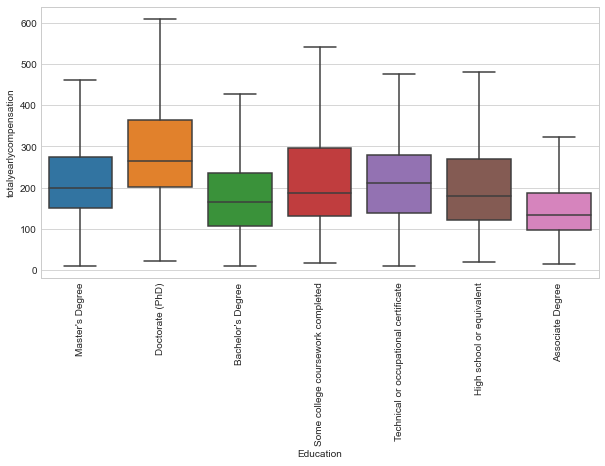

In [9]:
# box plot Education/total_yearly_compensation
var = 'Education'
f, ax = plt.subplots(figsize=(10, 5))
fig = sns.boxplot(x=var, y="totalyearlycompensation", data=salaries, showfliers = False)
plt.xticks(rotation=90)

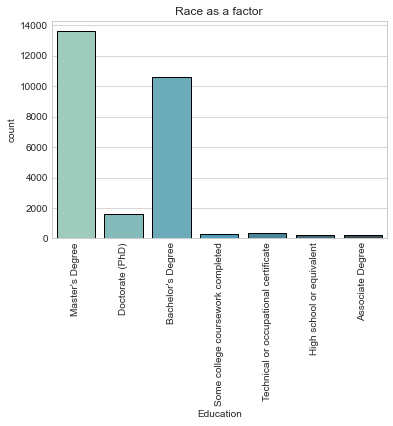

In [10]:
plt.figure(figsize=(6,4))
sns.countplot(data = salaries, x = 'Education', palette="GnBu_d",edgecolor="black")
plt.title('Race as a factor');
plt.xticks(rotation=90);

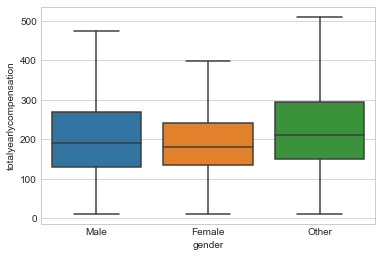

In [11]:
# box plot gender/total_yearly_compensation
var = 'gender'
f, ax = plt.subplots(figsize=(6, 4))
fig = sns.boxplot(x=var, y="totalyearlycompensation", data=salaries, showfliers = False)


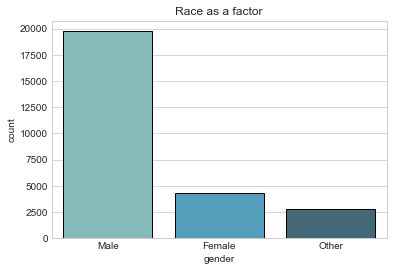

In [12]:
plt.figure(figsize=(6,4))
sns.countplot(data = salaries, x = 'gender', palette="GnBu_d",edgecolor="black")
plt.title('Race as a factor');
# plt.xticks(rotation=90);

(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, 'Asian'),
  Text(2, 0, 'Hispanic/Latino'),
  Text(3, 0, 'Black or African American'),
  Text(4, 0, 'Two or More Races'),
  Text(5, 0, 'White'),
  Text(6, 0, 'American Indian or Alaska Native'),
  Text(7, 0, 'Native Hawaiian or Other Pacific Islander')])

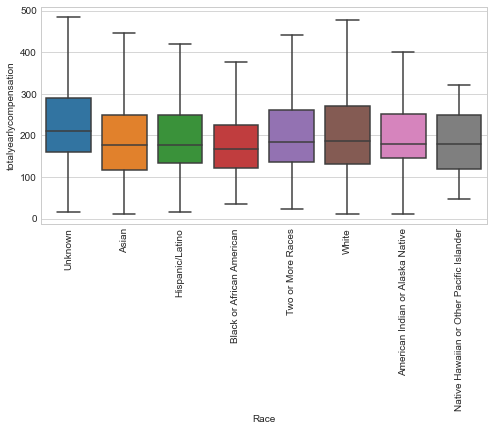

In [13]:
# box plot Race/total_yearly_compensation
var = 'Race'
f, ax = plt.subplots(figsize=(8, 4))
fig = sns.boxplot(x=var, y="totalyearlycompensation", data=salaries, showfliers = False)
plt.xticks(rotation=90)

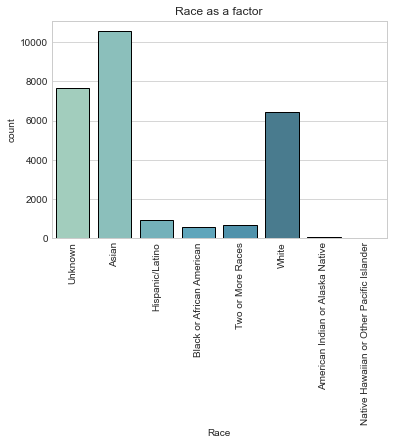

In [14]:
plt.figure(figsize=(6,4))
sns.countplot(data = salaries, x = 'Race', palette="GnBu_d",edgecolor="black")
plt.title('Race as a factor');
plt.xticks(rotation=90);

In [15]:
import plotly.express as px
def top_10_barchart(column_name, data_frame=salaries, orientation='h'):
    
    """
        arguments: column_name:str - name of the column
        data_frame:pandas data frame - default df
        orientation:str default: horizontal v - vertical                           
        returns:  bar plot object
    """
    
    #  If column_name is not str:
    if type(column_name) != str:
        raise ValueError(f'Expected type str, got: {type(column_name)}')
    
    
    #  If columm_name is not in data frame
    if column_name not in data_frame.columns:
        raise ValueError(f'{column_name} is not in DataFrame!')


    top_10 = (data_frame[column_name].value_counts().head(10))
    x_axis = top_10.index
    y_axis = top_10.values
    
    # when orientation is not correct
    if orientation not in ['h', 'v']:
        raise ValueError("""Choose correct orientation: 
                            h - horizontal,
                            v - vertical""")
    
    # in case when orientaion is vertical
    if orientation == 'v':
        x_axis, y_axis = y_axis, x_axis
    
    
    fig = px.bar(data_frame, x=x_axis, y=y_axis, color_discrete_sequence=['maroon'])
    
    #  setting x axis title when orientation is vertical
    if orientation == 'v':   
        fig.update_layout(xaxis=dict(title='frequency'),
                         yaxis=dict(title=f'{column_name}'))
        
     # setting y axes at title when orientation is horizontal
    else:
        fig.update_layout(yaxis=dict(title='frequency'),
                         xaxis=dict(title=f'{column_name}'))
    
    fig.update_layout(font=dict(family='Lato', size=16),
                     title=dict(text=f'<b>{column_name.capitalize()}<b>', 
                                font=dict(size=24),x=0.5),
                     plot_bgcolor='white')
    fig.show()

In [16]:
column_names = ['company', 'title', 'area']

for column in column_names:
    top_10_barchart(column)

In [17]:
pd.set_option('display.max_row', None)
salaries['area'].value_counts(dropna=False)

Seattle, WA                3670
San Francisco, CA          2428
New York, NY               1942
India                      1682
Redmond, WA                1106
San Jose, CA               1014
Mountain View, CA           952
Sunnyvale, CA               939
Canada                      915
Austin, TX                  757
Menlo Park, CA              659
Cupertino, CA               636
United Kingdom              616
Santa Clara, CA             580
Boston, MA                  501
Palo Alto, CA               490
San Diego, CA               325
Germany                     317
Los Angeles, CA             315
Chicago, IL                 314
Washington, DC              291
Bellevue, WA                285
Atlanta, GA                 270
Dallas, TX                  246
Taiwan                      196
Singapore                   190
Ireland                     178
Portland, OR                178
Redwood City, CA            175
Israel                      169
Arlington, VA               150
Hillsbor

In [18]:
pd.reset_option('^display.', silent=True)

In [19]:
salaries.columns

Index(['timestamp', 'company', 'title', 'totalyearlycompensation', 'location',
       'yearsofexperience', 'yearsatcompany', 'basesalary', 'stockgrantvalue',
       'bonus',
       ...
       'title_Marketing', 'title_Mechanical Engineer',
       'title_Product Designer', 'title_Product Manager', 'title_Recruiter',
       'title_Sales', 'title_Software Engineer',
       'title_Software Engineering Manager', 'title_Solution Architect',
       'title_Technical Program Manager'],
      dtype='object', length=560)

## 2.1 Study Continuous features

In [20]:
sal_con = salaries[['totalyearlycompensation','yearsofexperience', 'yearsatcompany', 'basesalary', 
                    'stockgrantvalue', 'bonus']]
sal_con

,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus
0,242.0,8.0,1.0,187.0,40.0,15.0
1,172.0,5.0,0.0,135.0,12.0,25.0
2,255.0,5.0,0.0,165.0,45.0,45.0
3,144.0,0.0,0.0,112.0,12.0,20.0
4,515.0,15.0,0.0,220.0,203.0,92.0
...,...,...,...,...,...,...
26889,77.0,0.0,0.0,62.0,0.0,15.0
26890,92.0,2.0,2.0,92.0,0.0,0.0
26891,241.0,9.0,0.0,150.0,46.0,45.0
26892,98.0,0.0,0.0,85.0,0.0,13.0


### Try to observe a relationship between totalyearlycompensation and other features

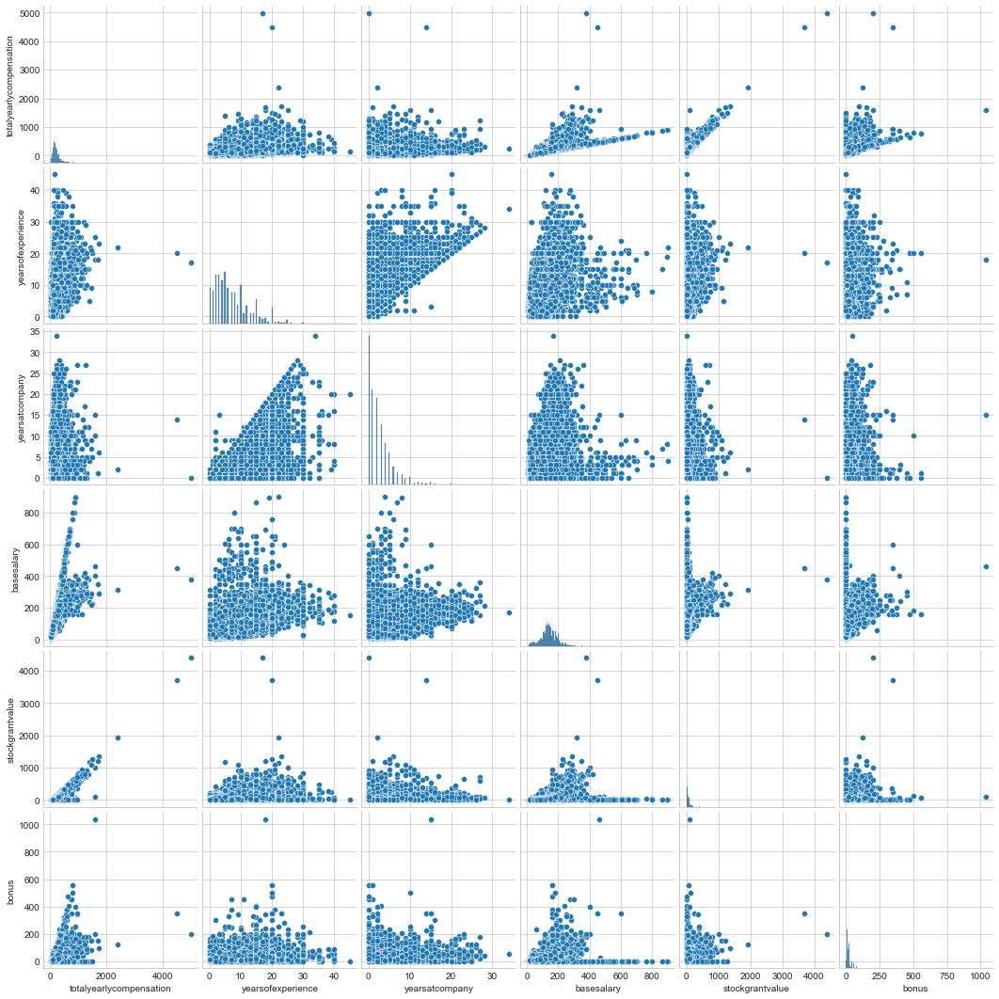

In [21]:
# # Try to observe a relationship between totalyearlycompensation and other features
sns.pairplot(sal_con)

In [22]:
# Check top 1% outliers
# Use "quantile" function to identify top 1% outliers

def one_perct_outliers(df_original, feature):
    
    df = df_original
    
    bot1 = df[feature].quantile(.01)
    top1 = df[feature].quantile(.99)
    print('Bottom 1% outliers have values <=', bot1)
    print('Top 1% outliers have values >=', top1)

    index = df[(df[feature] >= top1)].index
    print('Total rows to drop for', feature, '(top 1%):', index.size)
        
#     df.drop(df[df[feature] >= top1].index, inplace = True)
#     df.reset_index(drop = True, inplace = True)
    
    return df, index

There are total of 270 outliers based on top 1%.
However, I will not remove them because there are exceptional cases where individual can have high compensation


In [23]:
# There are total of 270 outliers (based on top 1%)
# However, I will not remove them because there are exceptional cases where individual can have high compensation
one_perct_compensation, index_comp = one_perct_outliers(salaries, "stockgrantvalue")
index_comp

Bottom 1% outliers have values <= 0.0
Top 1% outliers have values >= 380.2099999999991
Total rows to drop for stockgrantvalue (top 1%): 269


Int64Index([   17,   231,   236,   676,   688,   822,   916,   932,   939,
              960,
            ...
            26173, 26199, 26276, 26411, 26441, 26475, 26489, 26583, 26721,
            26727],
           dtype='int64', length=269)

<AxesSubplot:>

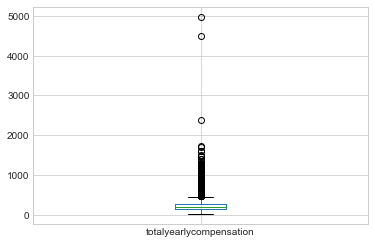

In [24]:
# Looking at boxplot, I will remove ONLY extreme outliers
# remove 3 data points from 'totalyearlycompensation'
cols=['totalyearlycompensation']
salaries.boxplot(column=cols)

<AxesSubplot:>

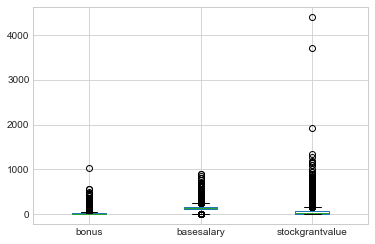

In [25]:
# Looking at boxplot, I will just remove ONLY extreme outliers
# remove 0 data points from 'basesalary' and 
# remove 1 data point from 'bonus'
# remove 3 data point from 'stockgrantvalue'

cols=['bonus', 'basesalary', 'stockgrantvalue']
salaries.boxplot(column=cols)

In [26]:
# Index location for extreme outliers
outlier_idx = salaries['totalyearlycompensation'].nlargest(n=3).index
outlier_idx = outlier_idx.append(salaries['bonus'].nlargest(n=1).index)

# outlier_idx = salaries['bonus'].nlargest(n=2).index
# outlier_idx = outlier_idx.append(salaries['basesalary'].nlargest(n=3).index)
outlier_idx = outlier_idx.append(salaries['stockgrantvalue'].nlargest(n=3).index)
outlier_idx

Int64Index([25540, 16293, 20805, 11340, 25540, 16293, 20805], dtype='int64')

In [27]:
# Note that there are repeated index (meaning entry belongs to same person)
outlier_idx_unique = outlier_idx.unique()
outlier_idx_unique

Int64Index([25540, 16293, 20805, 11340], dtype='int64')

In [28]:
# Remove entire row for those outliers
for i in outlier_idx_unique:
    print(i)
    
    salaries.drop(index = i, inplace = True)
    
salaries.reset_index(drop=True, inplace=True)
salaries

25540
16293
20805
11340


,timestamp,company,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,...,title_Marketing,title_Mechanical Engineer,title_Product Designer,title_Product Manager,title_Recruiter,title_Sales,title_Software Engineer,title_Software Engineering Manager,title_Solution Architect,title_Technical Program Manager
0,2019-10-29 16:04:25,Zillow,Software Engineer,242.0,"San Francisco, CA",8.0,1.0,187.0,40.0,15.0,...,0,0,0,0,0,0,1,0,0,0
1,2019-10-29 17:40:50,Amazon,Software Engineer,172.0,"Seattle, WA",5.0,0.0,135.0,12.0,25.0,...,0,0,0,0,0,0,1,0,0,0
2,2019-10-29 18:43:36,Zillow,Software Engineer,255.0,"Seattle, WA",5.0,0.0,165.0,45.0,45.0,...,0,0,0,0,0,0,1,0,0,0
3,2019-10-29 20:40:02,Amazon,Software Engineer,144.0,"Seattle, WA",0.0,0.0,112.0,12.0,20.0,...,0,0,0,0,0,0,1,0,0,0
4,2019-10-29 21:07:59,Google,Software Engineer,515.0,"Sunnyvale, CA",15.0,0.0,220.0,203.0,92.0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26885,2021-08-17 05:38:26,Bytedance,Software Engineer,77.0,"Singapore, SG, Singapore",0.0,0.0,62.0,0.0,15.0,...,0,0,0,0,0,0,1,0,0,0
26886,2021-08-17 06:47:07,Ncr,Software Engineer,92.0,"Atlanta, GA",2.0,2.0,92.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,0
26887,2021-08-17 08:16:36,Amazon,Product Manager,241.0,"Seattle, WA",9.0,0.0,150.0,46.0,45.0,...,0,0,0,1,0,0,0,0,0,0
26888,2021-08-17 08:22:17,Fidelity Investments,Software Engineer,98.0,"Durham, NC",0.0,0.0,85.0,0.0,13.0,...,0,0,0,0,0,0,1,0,0,0


In [29]:
sal_con = salaries[['totalyearlycompensation','yearsofexperience', 'yearsatcompany', 'basesalary', 
                    'stockgrantvalue', 'bonus']]
sal_con

,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus
0,242.0,8.0,1.0,187.0,40.0,15.0
1,172.0,5.0,0.0,135.0,12.0,25.0
2,255.0,5.0,0.0,165.0,45.0,45.0
3,144.0,0.0,0.0,112.0,12.0,20.0
4,515.0,15.0,0.0,220.0,203.0,92.0
...,...,...,...,...,...,...
26885,77.0,0.0,0.0,62.0,0.0,15.0
26886,92.0,2.0,2.0,92.0,0.0,0.0
26887,241.0,9.0,0.0,150.0,46.0,45.0
26888,98.0,0.0,0.0,85.0,0.0,13.0


### pairplot AFTER removing OUTLIERS

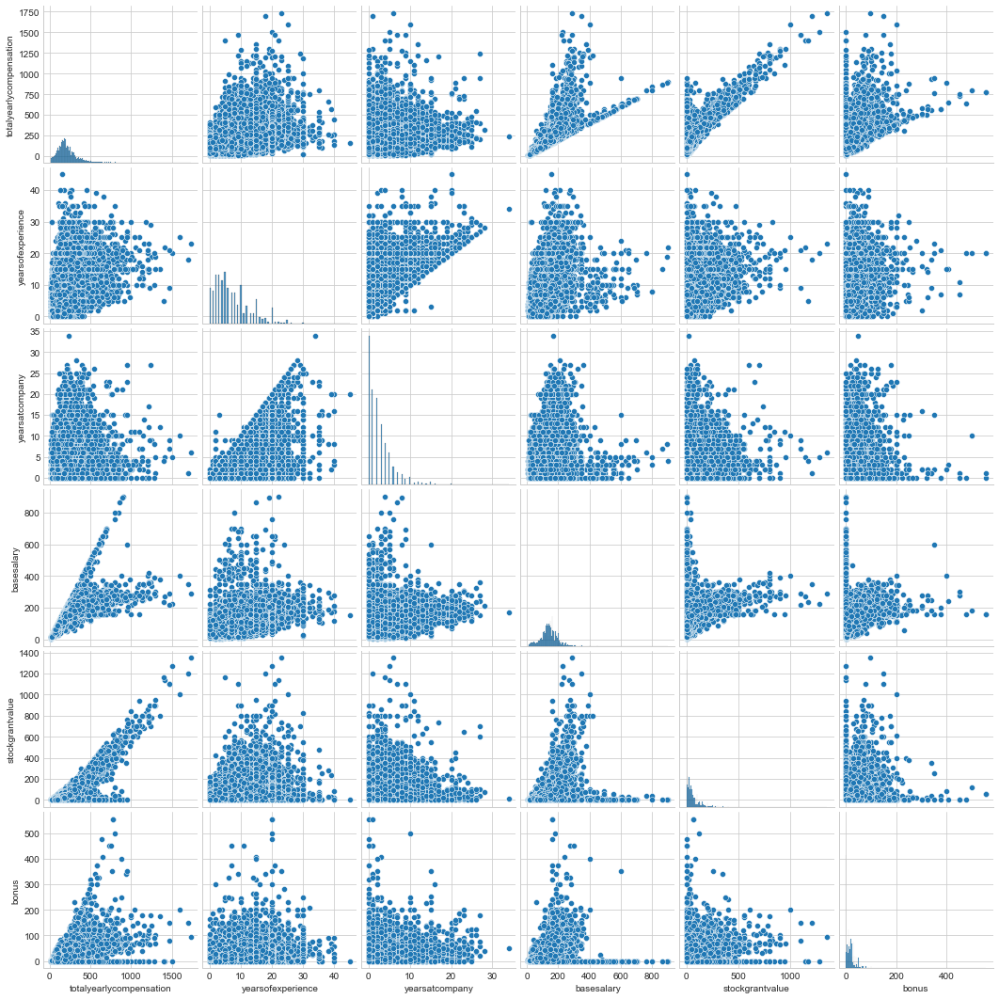

In [30]:
# AFTER removing OUTLIERS
# Try to observe a relationship between totalyearlycompensation and other features

# Note there there is still one outliers for bonus feature and we will remove it
sns.pairplot(sal_con)

In [31]:
# Check if time have a relationship with total yearly compensation
sal_con_time = salaries[['totalyearlycompensation','yearsofexperience', 'yearsatcompany', 
                         'basesalary', 'stockgrantvalue', 'bonus', 'year', 'month', 'week', 
                         'day', 'hour']]
sal_con_time

,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,year,month,week,day,hour
0,242.0,8.0,1.0,187.0,40.0,15.0,2019,10,44,29,16
1,172.0,5.0,0.0,135.0,12.0,25.0,2019,10,44,29,17
2,255.0,5.0,0.0,165.0,45.0,45.0,2019,10,44,29,18
3,144.0,0.0,0.0,112.0,12.0,20.0,2019,10,44,29,20
4,515.0,15.0,0.0,220.0,203.0,92.0,2019,10,44,29,21
...,...,...,...,...,...,...,...,...,...,...,...
26885,77.0,0.0,0.0,62.0,0.0,15.0,2021,8,33,17,5
26886,92.0,2.0,2.0,92.0,0.0,0.0,2021,8,33,17,6
26887,241.0,9.0,0.0,150.0,46.0,45.0,2021,8,33,17,8
26888,98.0,0.0,0.0,85.0,0.0,13.0,2021,8,33,17,8


<AxesSubplot:>

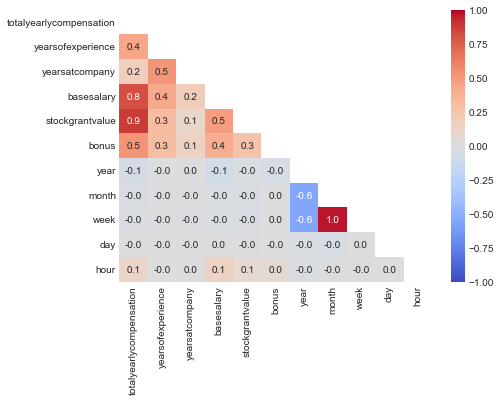

In [32]:
matrix = np.triu(sal_con_time.corr())

plt.figure(figsize = (7,5))
sns.heatmap(sal_con_time.corr(), annot=True, fmt='.1f', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', mask=matrix)

In [33]:
columns_to_drop = salaries[['timestamp','company', 'title', 'location', 'gender', 'Education', 
                            'Education_ordinal', 'Race', 'state_name', 'state', 'country',
                            'area', 'gender_nominal', 'Race_nominal', 'titleLabel', 
                            'companyLabel', 'areaLabel']]
columns_to_drop

,timestamp,company,title,location,gender,Education,Education_ordinal,Race,state_name,state,country,area,gender_nominal,Race_nominal,titleLabel,companyLabel,areaLabel
0,2019-10-29 16:04:25,Zillow,Software Engineer,"San Francisco, CA",Male,Master's Degree,2,Unknown,San Francisco,CA,United States,"San Francisco, CA",0,8,11,355,107
1,2019-10-29 17:40:50,Amazon,Software Engineer,"Seattle, WA",Male,Doctorate (PhD),1,Unknown,Seattle,WA,United States,"Seattle, WA",0,8,11,10,115
2,2019-10-29 18:43:36,Zillow,Software Engineer,"Seattle, WA",Male,Master's Degree,2,Unknown,Seattle,WA,United States,"Seattle, WA",0,8,11,355,115
3,2019-10-29 20:40:02,Amazon,Software Engineer,"Seattle, WA",Male,Master's Degree,2,Unknown,Seattle,WA,United States,"Seattle, WA",0,8,11,10,115
4,2019-10-29 21:07:59,Google,Software Engineer,"Sunnyvale, CA",Male,Doctorate (PhD),1,Unknown,Sunnyvale,CA,United States,"Sunnyvale, CA",0,8,11,149,122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26885,2021-08-17 05:38:26,Bytedance,Software Engineer,"Singapore, SG, Singapore",Male,Bachelor's Degree,3,Asian,Raffles Park,SG,Singapore,Singapore,0,1,11,61,116
26886,2021-08-17 06:47:07,Ncr,Software Engineer,"Atlanta, GA",Male,Bachelor's Degree,3,Asian,Atlanta,GA,United States,"Atlanta, GA",0,1,11,215,2
26887,2021-08-17 08:16:36,Amazon,Product Manager,"Seattle, WA",Female,Bachelor's Degree,3,Asian,Seattle,WA,United States,"Seattle, WA",1,1,8,10,115
26888,2021-08-17 08:22:17,Fidelity Investments,Software Engineer,"Durham, NC",Male,Associate Degree,5,White,Durham,NC,United States,"Durham, NC",0,5,11,131,32


In [34]:
columns_to_drop1 = ['timestamp','company', 'title', 'location', 'gender', 'Education','Education_ordinal', 
                    'Race', 'state_name', 'state', 'country', 'area', 'gender_nominal', 
                    'Race_nominal', 'titleLabel', 'companyLabel', 'areaLabel']
columns_to_drop1

['timestamp',
 'company',
 'title',
 'location',
 'gender',
 'Education',
 'Education_ordinal',
 'Race',
 'state_name',
 'state',
 'country',
 'area',
 'gender_nominal',
 'Race_nominal',
 'titleLabel',
 'companyLabel',
 'areaLabel']

In [35]:
salaries_final = salaries.drop(columns_to_drop1, axis = 1)
salaries_final

,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,year,month,week,day,...,title_Marketing,title_Mechanical Engineer,title_Product Designer,title_Product Manager,title_Recruiter,title_Sales,title_Software Engineer,title_Software Engineering Manager,title_Solution Architect,title_Technical Program Manager
0,242.0,8.0,1.0,187.0,40.0,15.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
1,172.0,5.0,0.0,135.0,12.0,25.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
2,255.0,5.0,0.0,165.0,45.0,45.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
3,144.0,0.0,0.0,112.0,12.0,20.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
4,515.0,15.0,0.0,220.0,203.0,92.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26885,77.0,0.0,0.0,62.0,0.0,15.0,2021,8,33,17,...,0,0,0,0,0,0,1,0,0,0
26886,92.0,2.0,2.0,92.0,0.0,0.0,2021,8,33,17,...,0,0,0,0,0,0,1,0,0,0
26887,241.0,9.0,0.0,150.0,46.0,45.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26888,98.0,0.0,0.0,85.0,0.0,13.0,2021,8,33,17,...,0,0,0,0,0,0,1,0,0,0


In [36]:
sal_df1 = salaries_final
sal_df1

,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,year,month,week,day,...,title_Marketing,title_Mechanical Engineer,title_Product Designer,title_Product Manager,title_Recruiter,title_Sales,title_Software Engineer,title_Software Engineering Manager,title_Solution Architect,title_Technical Program Manager
0,242.0,8.0,1.0,187.0,40.0,15.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
1,172.0,5.0,0.0,135.0,12.0,25.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
2,255.0,5.0,0.0,165.0,45.0,45.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
3,144.0,0.0,0.0,112.0,12.0,20.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
4,515.0,15.0,0.0,220.0,203.0,92.0,2019,10,44,29,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26885,77.0,0.0,0.0,62.0,0.0,15.0,2021,8,33,17,...,0,0,0,0,0,0,1,0,0,0
26886,92.0,2.0,2.0,92.0,0.0,0.0,2021,8,33,17,...,0,0,0,0,0,0,1,0,0,0
26887,241.0,9.0,0.0,150.0,46.0,45.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26888,98.0,0.0,0.0,85.0,0.0,13.0,2021,8,33,17,...,0,0,0,0,0,0,1,0,0,0


In [37]:
# sal_df1.to_csv('salaries_eda_clean.csv', index = False)

## Split data into train and test set

### Load the cleaned data set for building models

In this section, we will split the data into train, validation, and test set in preparation for fitting a basic model in the next section.

In [38]:
features = sal_df1.drop(['totalyearlycompensation'], axis=1)
labels = sal_df1[['totalyearlycompensation']]
label = 'totalyearlycompensation'

X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.3) # , random_state=42

In [39]:
# Check data are split correctly into train, validation and test set with 60%, 20%, 20% respectively
for dataset in [y_train, y_test]:
    print('Data is split into', round((len(dataset) / len(labels))*100, 2), '%, having', len(dataset), 'data.')

Data is split into 70.0 %, having 18823 data.
Data is split into 30.0 %, having 8067 data.


In [40]:
features

,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,year,month,week,day,hour,...,title_Marketing,title_Mechanical Engineer,title_Product Designer,title_Product Manager,title_Recruiter,title_Sales,title_Software Engineer,title_Software Engineering Manager,title_Solution Architect,title_Technical Program Manager
0,8.0,1.0,187.0,40.0,15.0,2019,10,44,29,16,...,0,0,0,0,0,0,1,0,0,0
1,5.0,0.0,135.0,12.0,25.0,2019,10,44,29,17,...,0,0,0,0,0,0,1,0,0,0
2,5.0,0.0,165.0,45.0,45.0,2019,10,44,29,18,...,0,0,0,0,0,0,1,0,0,0
3,0.0,0.0,112.0,12.0,20.0,2019,10,44,29,20,...,0,0,0,0,0,0,1,0,0,0
4,15.0,0.0,220.0,203.0,92.0,2019,10,44,29,21,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26885,0.0,0.0,62.0,0.0,15.0,2021,8,33,17,5,...,0,0,0,0,0,0,1,0,0,0
26886,2.0,2.0,92.0,0.0,0.0,2021,8,33,17,6,...,0,0,0,0,0,0,1,0,0,0
26887,9.0,0.0,150.0,46.0,45.0,2021,8,33,17,8,...,0,0,0,1,0,0,0,0,0,0
26888,0.0,0.0,85.0,0.0,13.0,2021,8,33,17,8,...,0,0,0,0,0,0,1,0,0,0


In [41]:
# Standarize all features 
scaler = StandardScaler()
features_scale = scaler.fit_transform(features)
X_train_scale = scaler.fit_transform(X_train)
# X_val_scale = scaler.transform(X_val)
X_test_scale = scaler.transform(X_test)

# Part 2: Machine Learning Models


## Functions that we will be using to access the model performance.

In [42]:
# Function to seach for Hyperparamaters using GridSearchCV for model optimization 

def print_best_params(gd_model):
    param_dict = gd_model.best_estimator_.get_params()
    model_str = str(gd_model.estimator).split('(')[0]
    print("\n*** {} Best Parameters ***".format(model_str))
    for k in param_dict:
        print("{}: {}".format(k, param_dict[k]))
    print()
    
    means = gd_model.cv_results_['mean_test_score']
    stds = gd_model.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, gd_model.cv_results_['params']):
        print('{} (+/-{}) for {}'.format(round(mean, 7), round(std * 2, 3), params))
    
    print('\nBEST PARAMS: {}\n'.format(gd_model.best_params_))
    
    return param_dict
    

In [43]:
# function to show ranking of importance feature for model used
def print_impt_feat(test_model, col):
    model = test_model
    feat_imp = model.best_estimator_.feature_importances_
    indices = np.argsort(feat_imp)
    plt.yticks(range(len(indices)), [X_train.columns[i] for i in indices])
    plt.barh(range(len(indices)), feat_imp[indices], color=col, align='center')
    plt.show()

In [44]:
# function to evaluate performance of classifier: accuracy, precision and recall

def evaluate_model(name, model, features, labels):
    start = time() # calculate how long it takes to make those predictions
    pred = model.predict(features)
    end = time()
    
    # then we compare model prediciton and model labels using accuracy, precision and recall
    accuracy = round(accuracy_score(labels, pred), 3)
    precision = round(precision_score(labels, pred), 3)
    recall = round(recall_score(labels, pred), 3)
    print('{} -- \tAccuracy: {} / Precision: {} / Recall: {} / Latency: {}ms'.format(name,
                                                                                     accuracy,
                                                                                     precision,
                                                                                     recall,
                                                                                     round((end - start)*1000, 1)))

In [45]:
# function for classification model to generate classification report and confusion matrix

def cls_report_confusion_matrix(test_model):
    model = test_model
    y_pred_dt = model.predict(X_train)
    print(classification_report(y_train_cat, y_pred_dt))
    cm = confusion_matrix(y_train_cat, y_pred_dt)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=cv_dt_clf.classes_)
    disp.plot(cmap= 'YlOrBr')

In [46]:
# Function for KernelRidge Regression

# def fit_plot_model_tuned(model, X_train, y_train, X_test, y_test, alpha, kernel, cv, degree, gamma):
def fit_plot_model_tuned(model, X_train, y_train, X_test, y_test, cv):
    
#     model = KernelRidge(alpha=alpha, kernel=kernel, degree = degree, gamma=gamma)
        
    model.fit(
        X=X_train,
        y=y_train#.values.ravel(),
    )
    
    y_hat_train = model.predict(X_train)
    y_hat_test = model.predict(X_test)
    
    y_train_pred = cross_val_predict(model, X_train, y_train, cv=cv) 
    y_test_pred = cross_val_predict(model, X_test, y_test, cv=cv)
        
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    sns.scatterplot(x = y_train, y = y_train_pred, edgecolors=(0, 0, 0), ax=ax[0], alpha=0.5)
    sns.scatterplot(x = y_test, y = y_test_pred, edgecolors=(0, 0, 0), ax=ax[1], alpha=0.5)

    for a in ax:
        a.set_xlabel('Measured')
        a.set_ylabel('Predicted')

        ax[0].plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=4)
        ax[1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
        ax[0].set_title('Train set')
        ax[1].set_title('Test set')
        fig.tight_layout()
    
    scores_train = cross_val_score(model, X_train, y_train, cv=cv)
    print('Mean CV accuracy:', np.mean(scores_train))
    print('Standard Deviation CV accuracy:', np.std(scores_train))
    print('')
    fig, ax = plt.subplots()
    sns.distplot(scores_train, rug=True, rug_kws={"color": "g"},
                  kde_kws={"color": "k", "lw": 2, "label": "KDE"},
                  hist_kws={"histtype": "step", "linewidth": 2,
                            "alpha": 1, "color": "g"})
    scores_train
    ax.set_xlabel('Score')
    ax.set_ylabel('Density')
    ax.set_title('PDF for Cross Validation Score')
    
    print('Train accuracy:', model.score(X_train, y_train))
    print('Test accuracy:', model.score(X_test, y_test))
    print('')
    
    print('Tuned hyperparamters values:' ,model.get_params())
    print('')
    r2 = round(r2_score(y_hat_train, y_train),5)
    mae = round(mean_absolute_error(y_hat_train, y_train),5)
    mse = round(mean_squared_error(y_hat_train, y_train),5)
    print('r2_score: {} \nmean_absolute_error: {} \nmean_squared_error: {}\n'.format(r2, mae, mse))

    print(f'Scaled RMSE: \n {rmse_scaled(y_train, y_hat_train)} (Train) \
    \n {rmse_scaled(y_test, y_hat_test)} (Test)')

    

In [47]:
# Print rmse error between true and predicted labels
def rmse_scaled(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    scale = np.sqrt(np.mean(y_true**2))
    return rmse/scale

In [48]:
# Print rmse error between true and predicted labels
def fit_plot_model(model, X_train, y_train, X_test, y_test):

    X_train_scale = X_train
    X_test_scale = X_test
    
    #fit model
    model = model.fit(X_train_scale,y_train.values.ravel())
    y_train_pred = model.predict(X_train_scale)
    y_test_pred = model.predict(X_test_scale)

    # Calculate score
    scores_train = cross_val_score(model, X_train_scale, y_train, cv=3)
    print('Mean CV accuracy:', np.mean(scores_train))
    print('Standard Deviation CV accuracy:', np.std(scores_train))
    print('')
    print('Train accuracy:', model.score(X_train_scale, y_train))
    print('Test accuracy:', model.score(X_test_scale, y_test))
    print('')

    r2 = round(r2_score(y_train_pred, y_train),5)
    mae = round(mean_absolute_error(y_train_pred, y_train),5)
    mse = round(mean_squared_error(y_train_pred, y_train),5)

    print('r2_score: {} \nmean_absolute_error: {} \nmean_squared_error: {}\n'.format(r2, mae, mse))
    print('Current hyperparamters values:', model.get_params())

    # Plot scatterplot for train and test dataset
    fig, ax = plt.subplots(1, 2, figsize=(10, 4)) # sharex=True: True or 'all': x- or y-axis will be shared among all subplots.

    sns.scatterplot(x=y_train.values.ravel(), y=y_train_pred, ax=ax[0], alpha=0.5)
    sns.scatterplot(x=y_test.values.ravel(), y=y_test_pred, ax=ax[1], alpha=0.5)

    for a in ax:
        a.set_xlabel(f'{label} (true)')
        a.set_ylabel(f'{label} (predict)')
        a.plot(a.get_xlim(), a.get_ylim(), ls='--', c='k')


    ax[0].set_title('Train set')
    ax[1].set_title('Test set')
    fig.tight_layout()

# Supervised Learning 
## Topic 1: KernelRidge() Regression with RBF kernel

Mean CV accuracy: 0.8830732928392738
Standard Deviation CV accuracy: 0.009810646873647669

Train accuracy: 0.9444018755735739
Test accuracy: 0.8907087370814906

r2_score: 0.93847 
mean_absolute_error: 15.96071 
mean_squared_error: 956.29043

Current hyperparamters values: {'alpha': 1, 'coef0': 1, 'degree': 3, 'gamma': None, 'kernel': 'rbf', 'kernel_params': None}


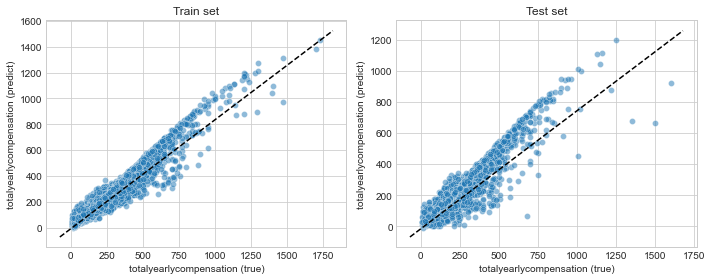

In [49]:
dt = KernelRidge(kernel= 'rbf')
fit_plot_model(dt, X_train_scale, y_train, X_test_scale, y_test)

### Screen shot of random results for RBF Kernel:

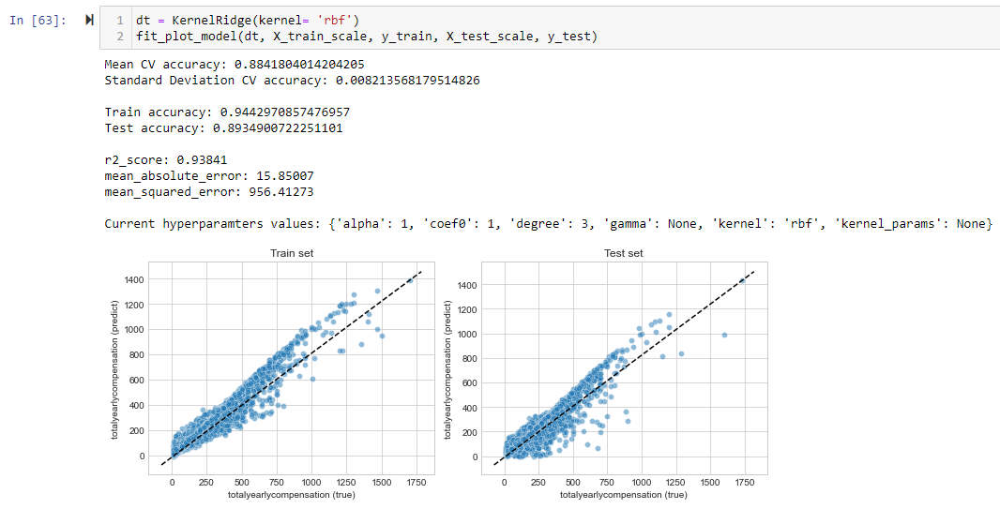

## Hyperparamaters Tuning using GridSearchCV for KernelRidge() = RBF

In [50]:
# Tuning for RBF kernel
# Limits chosen for alpha and gamma are selected after a few trial runs 

param_grid_kernelridge = dict(kernel = ['rbf'], 
                              alpha = [0.5, 0.8],
                              gamma = [0.001, None])

kernelridge = GridSearchCV(KernelRidge(), param_grid=param_grid_kernelridge, cv=3,  verbose=3)

#fit model
kernelridge = kernelridge.fit(X_train_scale,y_train.values.ravel())

#print score
print('\n\nRegressor train score %.3f\nRegressor test score: %.3f' % (
    kernelridge.score(X_train_scale,y_train), kernelridge.score(X_test_scale, y_test)))

Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV 1/3] END alpha=0.5, gamma=0.001, kernel=rbf;, score=0.931 total time=  18.3s
[CV 2/3] END alpha=0.5, gamma=0.001, kernel=rbf;, score=0.944 total time=  19.5s
[CV 3/3] END alpha=0.5, gamma=0.001, kernel=rbf;, score=0.941 total time=  18.5s
[CV 1/3] END .alpha=0.5, gamma=None, kernel=rbf;, score=0.888 total time=  19.0s
[CV 2/3] END .alpha=0.5, gamma=None, kernel=rbf;, score=0.908 total time=  19.3s
[CV 3/3] END .alpha=0.5, gamma=None, kernel=rbf;, score=0.903 total time=  19.9s
[CV 1/3] END alpha=0.8, gamma=0.001, kernel=rbf;, score=0.924 total time=  19.3s
[CV 2/3] END alpha=0.8, gamma=0.001, kernel=rbf;, score=0.939 total time=  19.2s
[CV 3/3] END alpha=0.8, gamma=0.001, kernel=rbf;, score=0.934 total time=  19.7s
[CV 1/3] END .alpha=0.8, gamma=None, kernel=rbf;, score=0.877 total time=  18.5s
[CV 2/3] END .alpha=0.8, gamma=None, kernel=rbf;, score=0.899 total time=  18.5s
[CV 3/3] END .alpha=0.8, gamma=None, kernel=rbf;,

In [51]:
param_dict = print_best_params(kernelridge)


*** KernelRidge Best Parameters ***
alpha: 0.5
coef0: 1
degree: 3
gamma: 0.001
kernel: rbf
kernel_params: None

0.9386673 (+/-0.011) for {'alpha': 0.5, 'gamma': 0.001, 'kernel': 'rbf'}
0.899751 (+/-0.017) for {'alpha': 0.5, 'gamma': None, 'kernel': 'rbf'}
0.9322996 (+/-0.013) for {'alpha': 0.8, 'gamma': 0.001, 'kernel': 'rbf'}
0.8893641 (+/-0.019) for {'alpha': 0.8, 'gamma': None, 'kernel': 'rbf'}

BEST PARAMS: {'alpha': 0.5, 'gamma': 0.001, 'kernel': 'rbf'}



Mean CV accuracy: 0.938667251592744
Standard Deviation CV accuracy: 0.005493408841956154

Train accuracy: 0.9726153304694566
Test accuracy: 0.9418216062710756

Tuned hyperparamters values: {'alpha': 0.5, 'coef0': 1, 'degree': 3, 'gamma': 0.001, 'kernel': 'rbf', 'kernel_params': None}

r2_score: 0.97077 
mean_absolute_error: 11.07466 
mean_squared_error: 471.01764

Scaled RMSE: 
 0.0864239836183801 (Train)     
 0.12355544962763233 (Test)


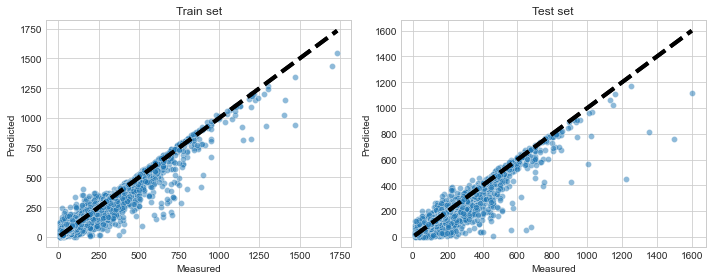

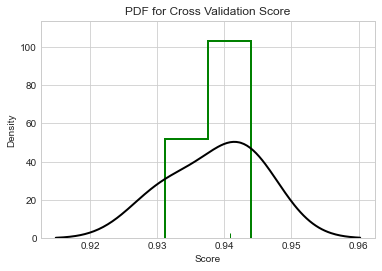

In [52]:
best_alpha = param_dict['alpha']
best_degree = param_dict['degree']
best_gamma = param_dict['gamma']
best_kernel = param_dict['kernel']

### Performance based on best parameters for KernelRidge() = RBF
model_tuned = KernelRidge(alpha = best_alpha, kernel= best_kernel, degree= best_degree, gamma= best_gamma)
fit_plot_model_tuned(model_tuned, X_train_scale, y_train.values.ravel(), X_test_scale, y_test.values.ravel(), cv = 3)
# fit_plot_model_tuned(model, X_train_scale, y_train.values.ravel(), X_test_scale, y_test.values.ravel(), alpha = best_alpha, kernel= best_kernel, cv = 3 , degree= best_degree, gamma= best_gamma)

# Supervised Learning 
## Topic 2: Decision Tree Regressor model

In [53]:
# DecisionTreeRegressor() model
# dt = DecisionTreeRegressor()
# fit_plot_model(dt, X_train_scale, y_train, X_test_scale, y_test)

In [54]:
# # DecisionTreeRegressor() model
# # DecisionTree do not need to use scaled data
# dt = DecisionTreeRegressor()
# fit_plot_model(dt, X_train, y_train, X_test, y_test)

Mean CV accuracy: 0.8540723150202888
Standard Deviation CV accuracy: 0.0049204112687044905

Train accuracy: 0.8594557259426852
Test accuracy: 0.8628000804490539

r2_score: 0.83647 
mean_absolute_error: 34.31294 
mean_squared_error: 2417.36831

Current hyperparamters values: {'ccp_alpha': 0.0, 'criterion': 'mse', 'max_depth': 4, 'max_features': None, 'max_leaf_nodes': 8, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}


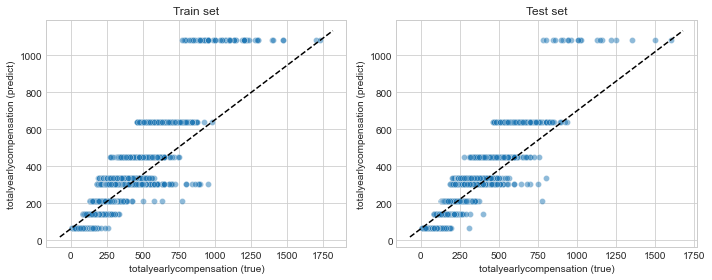

In [55]:
# DecisionTreeRegressor() model
# DecisionTree do not need to use scaled data
dt = DecisionTreeRegressor(max_depth = 4, max_features = None, max_leaf_nodes = 8)
fit_plot_model(dt, X_train, y_train, X_test, y_test)

In [56]:
# Tuning for decision tree
# Limits chosen for alpha and gamma are selected after a few trial runs 

param_grid_dt = dict(max_depth = [4, 8, 16],
                     max_leaf_nodes = [8, 16, 32],
                     criterion = ['poisson', 'squared_error', 'mse'],
                     max_features = ['sqrt', 'log2', None]
 )

dt_regressor = GridSearchCV(DecisionTreeRegressor(), param_grid=param_grid_dt, cv=3,  verbose=3)

#fit model
dt_regressor = dt_regressor.fit(X_train_scale,y_train.values.ravel())

#print score
print('\n\nRegressor train score %.3f\nRegressor test score: %.3f' % (
    dt_regressor.score(X_train_scale,y_train), dt_regressor.score(X_test_scale, y_test)))

Fitting 3 folds for each of 81 candidates, totalling 243 fits
[CV 1/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=8;, score=0.009 total time=   0.0s
[CV 2/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=8;, score=0.022 total time=   0.1s
[CV 3/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=8;, score=0.034 total time=   0.1s
[CV 1/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=0.008 total time=   0.0s
[CV 2/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=0.010 total time=   0.0s
[CV 3/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=0.006 total time=   0.0s
[CV 1/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=0.028 total time=   0.0s
[CV 2/3] END criterion=poisson, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=0.036 total time=   0.0s
[CV 3/3] END criterio

[CV 1/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=8;, score=0.126 total time=   0.8s
[CV 2/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=8;, score=0.033 total time=   0.8s
[CV 3/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=8;, score=0.115 total time=   0.9s
[CV 1/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=16;, score=0.186 total time=   1.9s
[CV 2/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=16;, score=0.102 total time=   1.9s
[CV 3/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=16;, score=0.170 total time=   1.7s
[CV 1/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=32;, score=0.188 total time=   1.9s
[CV 2/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_nodes=32;, score=0.110 total time=   2.0s
[CV 3/3] END criterion=poisson, max_depth=16, max_features=None, max_leaf_n

C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=4, max_features=sqrt, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 2/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 2/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=4, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 2/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 2/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=4, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s

C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa


[CV 3/3] END criterion=squared_error, max_depth=8, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=8, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=16, max_features=sqrt, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 3/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=16;, score=nan total time=   0.1s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 2/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=16, max_features=log2, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 2/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=8;, score=nan total time=   0.0s
[CV 1/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 2/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=16;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these pa

[CV 1/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 2/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s
[CV 3/3] END criterion=squared_error, max_depth=16, max_features=None, max_leaf_nodes=32;, score=nan total time=   0.0s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py:615: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 1252, in fit
    super().fit(
  File "C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\tree\_classes.py", line 351, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'




[CV 1/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=8;, score=0.047 total time=   0.0s
[CV 2/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=8;, score=0.257 total time=   0.0s
[CV 3/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=8;, score=0.029 total time=   0.0s
[CV 1/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=0.067 total time=   0.0s
[CV 2/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=0.082 total time=   0.0s
[CV 3/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=16;, score=0.595 total time=   0.0s
[CV 1/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=0.339 total time=   0.0s
[CV 2/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=0.307 total time=   0.0s
[CV 3/3] END criterion=mse, max_depth=4, max_features=sqrt, max_leaf_nodes=32;, score=0.047 total time=   0.0s
[CV 

[CV 3/3] END criterion=mse, max_depth=16, max_features=None, max_leaf_nodes=8;, score=0.860 total time=   0.4s
[CV 1/3] END criterion=mse, max_depth=16, max_features=None, max_leaf_nodes=16;, score=0.916 total time=   0.5s
[CV 2/3] END criterion=mse, max_depth=16, max_features=None, max_leaf_nodes=16;, score=0.911 total time=   0.5s
[CV 3/3] END criterion=mse, max_depth=16, max_features=None, max_leaf_nodes=16;, score=0.919 total time=   0.5s
[CV 1/3] END criterion=mse, max_depth=16, max_features=None, max_leaf_nodes=32;, score=0.953 total time=   0.5s
[CV 2/3] END criterion=mse, max_depth=16, max_features=None, max_leaf_nodes=32;, score=0.948 total time=   0.5s
[CV 3/3] END criterion=mse, max_depth=16, max_features=None, max_leaf_nodes=32;, score=0.953 total time=   0.5s


C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_search.py:922: UserWarning:

One or more of the test scores are non-finite: [ 0.02193081  0.00780781  0.02836997  0.01028647 -0.00136311  0.02927444
  0.04910415  0.04907382  0.04908788  0.02296155  0.06160391  0.07006232
  0.02657692  0.04764011  0.01226052  0.09096904  0.09880251  0.09884964
  0.04321453  0.05093692  0.04322434  0.03062982  0.04183397  0.04417166
  0.09096904  0.15231445  0.15573483         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
         nan         nan         nan         nan         nan         nan
  0.11086171  0.24831848  0.23098317  0.18132846  0.00904681  0.09448003
  0.85407232  0.9158414   0.9158414   0.42042242  0.3831599   0.48135051
  0.05009557  0.07883585  0.10082



Regressor train score 0.956
Regressor test score: 0.947


In [57]:
param_dict = print_best_params(dt_regressor)


*** DecisionTreeRegressor Best Parameters ***
ccp_alpha: 0.0
criterion: mse
max_depth: 8
max_features: None
max_leaf_nodes: 32
min_impurity_decrease: 0.0
min_impurity_split: None
min_samples_leaf: 1
min_samples_split: 2
min_weight_fraction_leaf: 0.0
random_state: None
splitter: best

0.0219308 (+/-0.02) for {'criterion': 'poisson', 'max_depth': 4, 'max_features': 'sqrt', 'max_leaf_nodes': 8}
0.0078078 (+/-0.004) for {'criterion': 'poisson', 'max_depth': 4, 'max_features': 'sqrt', 'max_leaf_nodes': 16}
0.02837 (+/-0.012) for {'criterion': 'poisson', 'max_depth': 4, 'max_features': 'sqrt', 'max_leaf_nodes': 32}
0.0102865 (+/-0.028) for {'criterion': 'poisson', 'max_depth': 4, 'max_features': 'log2', 'max_leaf_nodes': 8}
-0.0013631 (+/-0.005) for {'criterion': 'poisson', 'max_depth': 4, 'max_features': 'log2', 'max_leaf_nodes': 16}
0.0292744 (+/-0.07) for {'criterion': 'poisson', 'max_depth': 4, 'max_features': 'log2', 'max_leaf_nodes': 32}
0.0491041 (+/-0.06) for {'criterion': 'poisson'

Mean CV accuracy: 0.9509694979450546
Standard Deviation CV accuracy: 0.002438578300479018

Train accuracy: 0.955936292368023
Test accuracy: 0.9472346577807852

Tuned hyperparamters values: {'ccp_alpha': 0.0, 'criterion': 'mse', 'max_depth': 8, 'max_features': None, 'max_leaf_nodes': 32, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': None, 'splitter': 'best'}

r2_score: 0.95391 
mean_absolute_error: 19.57272 
mean_squared_error: 757.8979

Scaled RMSE: 
 0.10962788790946087 (Train)     
 0.1176672007300286 (Test)


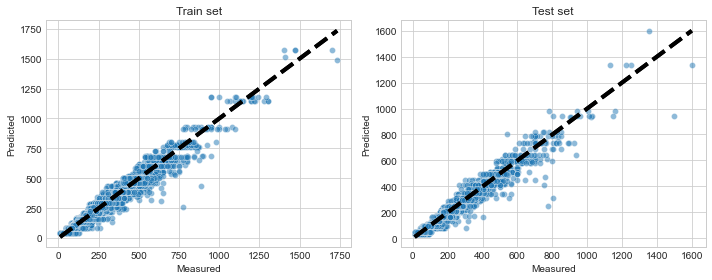

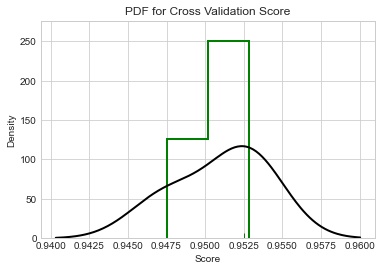

In [58]:
best_criterion = param_dict['criterion']
best_max_depth = param_dict['max_depth']
best_max_features = param_dict['max_features']
best_max_leaf_nodes = param_dict['max_leaf_nodes']

### Performance based on best parameters for KernelRidge() = RBF
model_tuned = DecisionTreeRegressor(criterion = best_criterion, max_depth= best_max_depth, 
                                    max_features= best_max_features, max_leaf_nodes= best_max_leaf_nodes)
fit_plot_model_tuned(model_tuned, X_train, y_train.values.ravel(), X_test, y_test.values.ravel(), cv = 3)
# fit_plot_model_tuned(model, X_train_scale, y_train.values.ravel(), X_test_scale, y_test.values.ravel(), alpha = best_alpha, kernel= best_kernel, cv = 3 , degree= best_degree, gamma= best_gamma)

# Supervised Learning 
## Topic 3: Fully Connected Neural Network (FCNN) using KerasRegressor

In [59]:
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

In [60]:
# Import libraries for FCNN
from numpy import loadtxt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras import layers, backend
from tensorflow.keras import activations
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
# from tensorflow.keras.utils.vis_utils import plot_model
# from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import SGD
from sklearn.metrics import mean_squared_error, r2_score

In [61]:
X_train_scale#.shape

array([[-0.72835095, -0.51630362, -0.5212237 , ..., -0.23144207,
        -0.13724527, -0.18608789],
       [ 0.29841074, -0.20973341,  0.4000702 , ..., -0.23144207,
        -0.13724527, -0.18608789],
       [ 0.12728379,  0.09683681,  0.80953416, ..., -0.23144207,
        -0.13724527, -0.18608789],
       ...,
       [-0.38609705,  0.09683681, -1.13541963, ..., -0.23144207,
        -0.13724527, -0.18608789],
       [-0.04384316,  0.25012191, -1.71549357, ..., -0.23144207,
        -0.13724527, -0.18608789],
       [ 0.12728379,  1.62968787, -1.05011464, ..., -0.23144207,
        -0.13724527, -0.18608789]])

In [62]:
y_train#.shape

,totalyearlycompensation
18863,141.0
3663,232.0
7866,263.0
1316,145.0
14151,176.0
...,...
20620,235.0
18554,294.0
23329,82.0
2590,65.0


In [63]:
y_train_flatten = y_train.values.ravel()
y_train_flatten#.shape

array([141., 232., 263., ...,  82.,  65., 155.])

In [64]:
X_test_scale#.shape

array([[-0.2149701 ,  0.09683681,  0.50243619, ..., -0.23144207,
        -0.13724527, -0.18608789],
       [ 0.81179159,  1.93625808,  0.33182621, ..., -0.23144207,
        -0.13724527, -0.18608789],
       [ 0.46953769,  0.40340702, -0.09469874, ..., -0.23144207,
        -0.13724527, -0.18608789],
       ...,
       [-0.38609705,  0.09683681, -1.98846955, ..., -0.23144207,
        -0.13724527, -0.18608789],
       [-1.07060485, -0.51630362, -0.18000373, ..., -0.23144207,
        -0.13724527, -0.18608789],
       [-0.8994779 , -0.20973341, -0.5212237 , ..., -0.23144207,
        -0.13724527, -0.18608789]])

In [65]:
y_test#.shape

,totalyearlycompensation
12802,250.0
14026,172.0
19068,150.0
1779,426.0
26066,133.0
...,...
13152,85.0
18454,155.0
8077,24.0
17862,170.0


In [66]:
y_test_flatten = y_test.values.ravel()
y_test_flatten#.shape

array([250., 172., 150., ...,  24., 170., 128.])

In [67]:
type(X_train_scale)

numpy.ndarray

In [68]:
type(X_test_scale)

numpy.ndarray

In [69]:
type(y_train_flatten)

numpy.ndarray

In [70]:
type(y_test)

pandas.core.frame.DataFrame

In [71]:
2**14

16384

### Try to find number of layers and node required (no hyperparameter tuning yet)

I build the FCNN by some trial and error to see its performance first before going tuning its Batch Size and Number of Epochs.

In [72]:
X_train_scale_input = Input(shape=X_train_scale.shape) # our input: an image with size 28 x 28 x 1 (1 channel)
col_len = X_train_scale_input.shape[2]
col_len

542

In [73]:
model = Sequential()
model.add(Dense(542, input_dim=542, kernel_initializer='normal', activation='linear'))
# model.add(Dense(400, kernel_initializer='normal', activation='relu'))
model.add(Dense(300, kernel_initializer='normal', activation='relu'))
# model.add(Dense(200, kernel_initializer='normal', activation='relu'))
model.add(Dense(100, kernel_initializer='normal', activation='relu'))
model.add(Dense(1, kernel_initializer='normal'))
model.summary()
model.compile(loss='mean_squared_error', 
              optimizer= 'Adam',
              metrics=  ['mse', 'mae', 'mape', rmse],
             )

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 542)               294306    
_________________________________________________________________
dense_1 (Dense)              (None, 300)               162900    
_________________________________________________________________
dense_2 (Dense)              (None, 100)               30100     
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 101       
Total params: 487,407
Trainable params: 487,407
Non-trainable params: 0
_________________________________________________________________


In [74]:
initial_weights = model.get_weights()  # We save initial weights for later use

In [75]:
history = model.fit(
    x= X_train_scale,
    y= y_train,
    batch_size= col_len, #col_len, #2**14, #16384, # using SGD (need to specify the batch size - power of 2 (comp memory chip, process faster)) 
    epochs= 250, # epochs: an run-through entire dataset, go through all 60,000 examples 10 times.
    validation_data= (X_test_scale, y_test), # to evalute how well the performance, us the test set (not doing hyperparameter tuning here)
    verbose=2,
)

Epoch 1/250
35/35 - 1s - loss: 48400.1406 - mse: 48400.1406 - mae: 183.6270 - mape: 86.7245 - rmse: 183.6270 - val_loss: 13546.4863 - val_mse: 13546.4863 - val_mae: 92.8736 - val_mape: 50.7907 - val_rmse: 92.8736
Epoch 2/250
35/35 - 0s - loss: 8457.1982 - mse: 8457.1982 - mae: 68.7626 - mape: 44.1581 - rmse: 68.7626 - val_loss: 4199.1294 - val_mse: 4199.1294 - val_mae: 44.7353 - val_mape: 29.4460 - val_rmse: 44.7353
Epoch 3/250
35/35 - 0s - loss: 2551.8354 - mse: 2551.8354 - mae: 33.5736 - mape: 23.8248 - rmse: 33.5736 - val_loss: 1950.4163 - val_mse: 1950.4163 - val_mae: 26.1852 - val_mape: 18.2944 - val_rmse: 26.1852
Epoch 4/250
35/35 - 0s - loss: 1225.8363 - mse: 1225.8363 - mae: 20.5434 - mape: 15.9802 - rmse: 20.5434 - val_loss: 1279.5757 - val_mse: 1279.5757 - val_mae: 17.6340 - val_mape: 13.0161 - val_rmse: 17.6340
Epoch 5/250
35/35 - 0s - loss: 796.5537 - mse: 796.5537 - mae: 14.4942 - mape: 12.4532 - rmse: 14.4942 - val_loss: 1023.4789 - val_mse: 1023.4789 - val_mae: 14.1464 -

Epoch 43/250
35/35 - 0s - loss: 44.5315 - mse: 44.5315 - mae: 3.6502 - mape: 3.2558 - rmse: 3.6502 - val_loss: 141.7180 - val_mse: 141.7180 - val_mae: 4.8983 - val_mape: 4.0958 - val_rmse: 4.8983
Epoch 44/250
35/35 - 0s - loss: 45.9177 - mse: 45.9177 - mae: 3.7057 - mape: 3.2659 - rmse: 3.7057 - val_loss: 147.7200 - val_mse: 147.7200 - val_mae: 5.0042 - val_mape: 4.1071 - val_rmse: 5.0042
Epoch 45/250
35/35 - 0s - loss: 43.9312 - mse: 43.9312 - mae: 3.5747 - mape: 3.1335 - rmse: 3.5747 - val_loss: 139.3082 - val_mse: 139.3082 - val_mae: 4.7872 - val_mape: 3.9407 - val_rmse: 4.7872
Epoch 46/250
35/35 - 0s - loss: 39.8570 - mse: 39.8570 - mae: 3.3359 - mape: 2.9773 - rmse: 3.3359 - val_loss: 132.1596 - val_mse: 132.1596 - val_mae: 4.5705 - val_mape: 3.9661 - val_rmse: 4.5705
Epoch 47/250
35/35 - 0s - loss: 41.2549 - mse: 41.2549 - mae: 3.3670 - mape: 2.9853 - rmse: 3.3670 - val_loss: 134.9645 - val_mse: 134.9645 - val_mae: 4.6310 - val_mape: 3.8488 - val_rmse: 4.6310
Epoch 48/250
35/35 -

Epoch 85/250
35/35 - 0s - loss: 16.1936 - mse: 16.1936 - mae: 2.2673 - mape: 1.8574 - rmse: 2.2673 - val_loss: 86.0261 - val_mse: 86.0261 - val_mae: 3.3596 - val_mape: 2.8515 - val_rmse: 3.3596
Epoch 86/250
35/35 - 0s - loss: 17.9655 - mse: 17.9655 - mae: 2.2372 - mape: 1.8542 - rmse: 2.2372 - val_loss: 88.6750 - val_mse: 88.6750 - val_mae: 3.4985 - val_mape: 2.9188 - val_rmse: 3.4985
Epoch 87/250
35/35 - 0s - loss: 17.6788 - mse: 17.6788 - mae: 2.2692 - mape: 1.9027 - rmse: 2.2692 - val_loss: 86.9491 - val_mse: 86.9491 - val_mae: 3.4918 - val_mape: 2.9443 - val_rmse: 3.4918
Epoch 88/250
35/35 - 0s - loss: 15.6590 - mse: 15.6590 - mae: 2.0977 - mape: 1.7222 - rmse: 2.0977 - val_loss: 80.8773 - val_mse: 80.8773 - val_mae: 3.3193 - val_mape: 2.7824 - val_rmse: 3.3193
Epoch 89/250
35/35 - 0s - loss: 15.0680 - mse: 15.0680 - mae: 2.1144 - mape: 1.7287 - rmse: 2.1144 - val_loss: 80.4933 - val_mse: 80.4933 - val_mae: 3.4245 - val_mape: 2.8622 - val_rmse: 3.4245
Epoch 90/250
35/35 - 1s - loss

Epoch 128/250
35/35 - 1s - loss: 17.0461 - mse: 17.0461 - mae: 2.2908 - mape: 1.7373 - rmse: 2.2908 - val_loss: 77.6687 - val_mse: 77.6687 - val_mae: 3.4177 - val_mape: 2.8066 - val_rmse: 3.4177
Epoch 129/250
35/35 - 1s - loss: 20.1768 - mse: 20.1768 - mae: 2.6001 - mape: 1.8754 - rmse: 2.6001 - val_loss: 85.6765 - val_mse: 85.6765 - val_mae: 3.7396 - val_mape: 2.8728 - val_rmse: 3.7396
Epoch 130/250
35/35 - 1s - loss: 20.5751 - mse: 20.5751 - mae: 2.5924 - mape: 1.9427 - rmse: 2.5924 - val_loss: 85.9253 - val_mse: 85.9253 - val_mae: 3.5195 - val_mape: 2.7411 - val_rmse: 3.5195
Epoch 131/250
35/35 - 0s - loss: 18.2500 - mse: 18.2500 - mae: 2.5176 - mape: 1.8311 - rmse: 2.5176 - val_loss: 78.5046 - val_mse: 78.5046 - val_mae: 3.7881 - val_mape: 2.8720 - val_rmse: 3.7881
Epoch 132/250
35/35 - 0s - loss: 23.7835 - mse: 23.7835 - mae: 2.7716 - mape: 1.9835 - rmse: 2.7716 - val_loss: 81.1900 - val_mse: 81.1900 - val_mae: 3.6369 - val_mape: 2.9216 - val_rmse: 3.6369
Epoch 133/250
35/35 - 0s 

Epoch 171/250
35/35 - 0s - loss: 12.7632 - mse: 12.7632 - mae: 2.1914 - mape: 1.5768 - rmse: 2.1914 - val_loss: 65.0552 - val_mse: 65.0552 - val_mae: 2.9432 - val_mape: 2.4303 - val_rmse: 2.9432
Epoch 172/250
35/35 - 0s - loss: 10.4090 - mse: 10.4090 - mae: 1.9218 - mape: 1.4440 - rmse: 1.9218 - val_loss: 66.6290 - val_mse: 66.6290 - val_mae: 2.9732 - val_mape: 2.4608 - val_rmse: 2.9732
Epoch 173/250
35/35 - 0s - loss: 10.6628 - mse: 10.6628 - mae: 1.8895 - mape: 1.4268 - rmse: 1.8895 - val_loss: 67.2102 - val_mse: 67.2102 - val_mae: 2.9288 - val_mape: 2.4158 - val_rmse: 2.9288
Epoch 174/250
35/35 - 0s - loss: 7.7537 - mse: 7.7537 - mae: 1.7746 - mape: 1.3113 - rmse: 1.7746 - val_loss: 63.7293 - val_mse: 63.7293 - val_mae: 3.1335 - val_mape: 2.4793 - val_rmse: 3.1335
Epoch 175/250
35/35 - 0s - loss: 9.5335 - mse: 9.5335 - mae: 1.9586 - mape: 1.3942 - rmse: 1.9586 - val_loss: 70.6957 - val_mse: 70.6957 - val_mae: 3.1155 - val_mape: 2.6529 - val_rmse: 3.1155
Epoch 176/250
35/35 - 0s - lo

Epoch 214/250
35/35 - 1s - loss: 7.1216 - mse: 7.1216 - mae: 1.6577 - mape: 1.2432 - rmse: 1.6577 - val_loss: 62.6359 - val_mse: 62.6359 - val_mae: 2.8034 - val_mape: 2.3263 - val_rmse: 2.8034
Epoch 215/250
35/35 - 0s - loss: 9.4950 - mse: 9.4950 - mae: 2.0556 - mape: 1.4260 - rmse: 2.0556 - val_loss: 62.2027 - val_mse: 62.2027 - val_mae: 3.0249 - val_mape: 2.4059 - val_rmse: 3.0249
Epoch 216/250
35/35 - 0s - loss: 8.9322 - mse: 8.9322 - mae: 1.9731 - mape: 1.4098 - rmse: 1.9731 - val_loss: 61.2000 - val_mse: 61.2000 - val_mae: 2.7744 - val_mape: 2.2809 - val_rmse: 2.7744
Epoch 217/250
35/35 - 0s - loss: 7.9055 - mse: 7.9055 - mae: 1.7826 - mape: 1.3316 - rmse: 1.7826 - val_loss: 60.6904 - val_mse: 60.6904 - val_mae: 2.6962 - val_mape: 2.2823 - val_rmse: 2.6962
Epoch 218/250
35/35 - 0s - loss: 7.5947 - mse: 7.5947 - mae: 1.6578 - mape: 1.2916 - rmse: 1.6578 - val_loss: 68.8050 - val_mse: 68.8050 - val_mae: 2.8652 - val_mape: 2.5339 - val_rmse: 2.8652
Epoch 219/250
35/35 - 0s - loss: 9.

In [76]:
history_df = pd.DataFrame(history.history)
history_df['epoch'] = history.epoch
history_df#.head()

,loss,mse,mae,mape,rmse,val_loss,val_mse,val_mae,val_mape,val_rmse,epoch
0,48400.140625,48400.140625,183.627029,86.724503,183.627029,13546.486328,13546.486328,92.873642,50.790661,92.873642,0
1,8457.198242,8457.198242,68.762581,44.158123,68.762581,4199.129395,4199.129395,44.735336,29.446026,44.735329,1
2,2551.835449,2551.835449,33.573635,23.824755,33.573635,1950.416260,1950.416260,26.185200,18.294403,26.185200,2
3,1225.836304,1225.836304,20.543411,15.980237,20.543411,1279.575684,1279.575684,17.634033,13.016150,17.634033,3
4,796.553711,796.553711,14.494205,12.453249,14.494203,1023.478882,1023.478882,14.146381,11.151638,14.146380,4
...,...,...,...,...,...,...,...,...,...,...,...
245,13.654746,13.654746,2.522985,1.695562,2.522985,75.429764,75.429764,4.470694,2.985415,4.470694,245
246,11.349220,11.349220,2.238437,1.538859,2.238437,63.165157,63.165157,3.161279,2.428741,3.161279,246
247,9.066233,9.066233,1.981907,1.401151,1.981907,63.711594,63.711594,3.241196,2.458976,3.241196,247
248,8.428118,8.428118,1.965917,1.380943,1.965917,61.618958,61.618958,3.305969,2.466219,3.305969,248


### Observe that:
* As we train our more and more, we expect it to become optimize
* Variance for Root mean squre error (rmse) between train and test set is very small  
* Variance for Mean squre error (rmse) is higher but will eventually get close if we run more epoch  



<AxesSubplot:title={'center':'Root Mean Square Error'}, xlabel='epoch'>

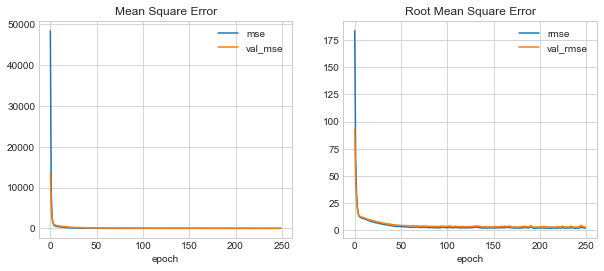

In [77]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

history_df.plot(x='epoch', y=['mse', 'val_mse'], ax=ax[0], title='Mean Square Error')
history_df.plot(x='epoch', y=['rmse', 'val_rmse'], ax=ax[1], title='Root Mean Square Error')

Using the above model, I am going to use KerasRegressor here and cross validation to see my model performance on my train data set. 

Where I get mse = 36 (approx).

In [78]:
def fcnn_model_01():
    model = Sequential()
    model.add(Dense(542, input_dim=542, kernel_initializer='normal', activation='linear'))
#     model.add(Dense(400, kernel_initializer='normal', activation='relu'))
    model.add(Dense(300, kernel_initializer='normal', activation='relu'))
#     model.add(Dense(200, kernel_initializer='normal', activation='relu'))
    model.add(Dense(100, kernel_initializer='normal', activation='relu'))
    model.add(Dense(1, kernel_initializer='normal'))
    model.summary()
    model.compile(loss='mean_squared_error', 
                  optimizer= 'Adam',
                  metrics=  ['mse', 'mae', 'mape', rmse],
                 )
    return model

# evaluate model random parameters
estimator = KerasRegressor(build_fn=fcnn_model_01, epochs=250, batch_size=col_len, verbose=0)

kfold = KFold(n_splits=3)
results = cross_val_score(estimator, X_train_scale, y_train, cv=kfold)

print("Baseline: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 542)               294306    
_________________________________________________________________
dense_5 (Dense)              (None, 300)               162900    
_________________________________________________________________
dense_6 (Dense)              (None, 100)               30100     
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 101       
Total params: 487,407
Trainable params: 487,407
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 542)               294306    
__________________________

In [79]:
estimator.fit(X_train_scale, y_train)

prediction = estimator.predict(X_train_scale)
print('Score for Training set')
print('Mean squared error:' ,mean_squared_error(y_train, prediction))
print('R2 Score:' ,r2_score(y_train, prediction))
print()

prediction_testset = estimator.predict(X_test_scale)
print('Score for Test set')
print('Mean squared error:' ,mean_squared_error(y_test, prediction_testset))
print('R2 Score:' ,r2_score(y_test, prediction_testset))
print()

print(
    f'Scaled RMSE: \n {rmse_scaled(y_train.values.ravel(), prediction)} (Train) \
    \n {rmse_scaled(y_test.values.ravel(), prediction_testset)} (Test)'
)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16 (Dense)             (None, 542)               294306    
_________________________________________________________________
dense_17 (Dense)             (None, 300)               162900    
_________________________________________________________________
dense_18 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_19 (Dense)             (None, 1)                 101       
Total params: 487,407
Trainable params: 487,407
Non-trainable params: 0
_________________________________________________________________
Score for Training set
Mean squared error: 5.814996571787892
R2 Score: 0.9996619197549226

Score for Test set
Mean squared error: 63.75309324357047
R2 Score: 0.9961718810730346

Scaled RMSE: 
 0.00960263509670833 (Train)     
 0.03169375912596726

## Hyperparameter tuning for FCNN

Using the same fully connected neural network model as above, we will train some hyperparameters (Batch Size and Number of Epochs) to improve our model. 

### Tune Batch Size and Number of Epochs

In [80]:
# Our Fully connected Neural Network (FCNN)
def fcnn_model_03():
    model_03 = Sequential()
    model_03.add(Dense(542, input_dim=542, kernel_initializer='normal', activation='linear'))
#     model_03.add(Dense(400, kernel_initializer='normal', activation='relu'))
    model_03.add(Dense(300, kernel_initializer='normal', activation='relu'))
#     model_03.add(Dense(200, kernel_initializer='normal', activation='relu'))
    model_03.add(Dense(100, kernel_initializer='normal', activation='relu'))
    model_03.add(Dense(1, kernel_initializer='normal'))
    model_03.compile(loss='mean_squared_error', optimizer= 'Adam', metrics=  ['mse', 'mae', 'mape', rmse])
    model_03.summary()
    return model_03

# create model
model_03 = KerasRegressor(build_fn=fcnn_model_03, verbose=0)

# Tune Batch Size and Number of Epochs

# This is the better performing batch size I found after a few tries, I only kept 1 value because 
# it is taking a very long time to run
batch_size = [col_len] 
epochs = [250, 300, 350]

param_grid = dict(batch_size= batch_size, epochs= epochs)
grid = GridSearchCV(estimator= model_03, param_grid= param_grid, n_jobs= -1, cv= 3) #, scoring= scoring
grid_result = grid.fit(X_train_scale, y_train)

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_20 (Dense)             (None, 542)               294306    
_________________________________________________________________
dense_21 (Dense)             (None, 300)               162900    
_________________________________________________________________
dense_22 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_23 (Dense)             (None, 1)                 101       
Total params: 487,407
Trainable params: 487,407
Non-trainable params: 0
_________________________________________________________________


In [81]:
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']

for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: -114.721105 using {'batch_size': 542, 'epochs': 350}
-126.638331 (1.450237) with: {'batch_size': 542, 'epochs': 250}
-124.683805 (16.480572) with: {'batch_size': 542, 'epochs': 300}
-114.721105 (7.020888) with: {'batch_size': 542, 'epochs': 350}


### Perform cross validation with our Best tuned parameters

In [82]:
param_dict = print_best_params(grid_result)


*** <tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x000002C761552DC0> Best Parameters ***
verbose: 0
batch_size: 542
epochs: 350
build_fn: <function fcnn_model_03 at 0x000002C759A5EE50>

-126.6383311 (+/-2.9) for {'batch_size': 542, 'epochs': 250}
-124.6838048 (+/-32.961) for {'batch_size': 542, 'epochs': 300}
-114.7211049 (+/-14.042) for {'batch_size': 542, 'epochs': 350}

BEST PARAMS: {'batch_size': 542, 'epochs': 350}



In [83]:
best_batch_size = param_dict['batch_size']
best_epochs = param_dict['epochs']

In [84]:
# evaluate model with best epochs and batch_size
estimator = KerasRegressor(build_fn=fcnn_model_03, epochs=best_epochs, batch_size=best_batch_size, verbose=0)

kfold = KFold(n_splits=3)
results = cross_val_score(estimator, X_train_scale, y_train, cv=kfold)

print("Baseline: %.2f (%.2f) MSE" % (results.mean(), results.std()))

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 542)               294306    
_________________________________________________________________
dense_25 (Dense)             (None, 300)               162900    
_________________________________________________________________
dense_26 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_27 (Dense)             (None, 1)                 101       
Total params: 487,407
Trainable params: 487,407
Non-trainable params: 0
_________________________________________________________________
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_28 (Dense)             (None, 542)               294306    
__________________________

Note that the mean sqaured error of cross validation score reduced from 36% to 4% which is a big improvemnt.

In [85]:
estimator.fit(X_train_scale, y_train)

prediction = estimator.predict(X_train_scale)
print('Score for Training set')
print('Mean squared error:' ,mean_squared_error(y_train, prediction))
print('R2 Score:' ,r2_score(y_train, prediction))
print()

prediction_testset = estimator.predict(X_test_scale)
print('Score for Test set')
print('Mean squared error:' ,mean_squared_error(y_test, prediction_testset))
print('R2 Score:' ,r2_score(y_test, prediction_testset))
print()

print(
    f'Scaled RMSE: \n {rmse_scaled(y_train.values.ravel(), prediction)} (Train) \
    \n {rmse_scaled(y_test.values.ravel(), prediction_testset)} (Test)'
)

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 542)               294306    
_________________________________________________________________
dense_37 (Dense)             (None, 300)               162900    
_________________________________________________________________
dense_38 (Dense)             (None, 100)               30100     
_________________________________________________________________
dense_39 (Dense)             (None, 1)                 101       
Total params: 487,407
Trainable params: 487,407
Non-trainable params: 0
_________________________________________________________________
Score for Training set
Mean squared error: 3.677666039521559
R2 Score: 0.9997861828084325

Score for Test set
Mean squared error: 57.318147348893795
R2 Score: 0.996558273903878

Scaled RMSE: 
 0.007636631578789005 (Train)     
 0.0300517103737825

### Screenshot:
#### Before hyperparameter tuning:

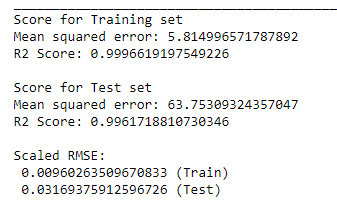

#### After hyperparameter tuning:

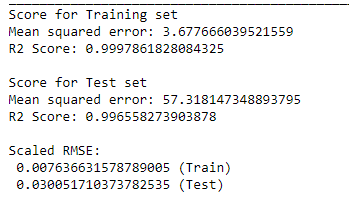

A slight improvement is observe.

## Conclusion for Supervised model

All 3 machine learning used here gave pretty good results.

In terms of computation time, Decision Tree is the best, while Fully connected neural network takes the longest time to compute, this actually depends on the complexity: 
* number of neurons (how wide is the network)
* number of layers (depth)
* size of dataset (the one I am using is pretty large)

I think that decision tree would be a better choice for my model here in terms of complexity, excution time and accuary/score that are achievable.

# Part 2: Unsupervised Learning 
## Topic 0: Preparing data for Unsupervised Learning

### Topic 1: Principal Component Analysis (PCA)

In [87]:
salaries_clean = salaries_ori.copy()
salaries_clean

,timestamp,company,title,totalyearlycompensation,location,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,...,month,week,day,hour,Education_ordinal,gender_nominal,Race_nominal,titleLabel,areaLabel,companyLabel
0,2019-10-29 16:04:25,Zillow,Software Engineer,242.0,"San Francisco, CA",8.0,1.0,187.0,40.0,15.0,...,10,44,29,16,2,0,8,11,107,355
1,2019-10-29 17:40:50,Amazon,Software Engineer,172.0,"Seattle, WA",5.0,0.0,135.0,12.0,25.0,...,10,44,29,17,1,0,8,11,115,10
2,2019-10-29 18:43:36,Zillow,Software Engineer,255.0,"Seattle, WA",5.0,0.0,165.0,45.0,45.0,...,10,44,29,18,2,0,8,11,115,355
3,2019-10-29 20:40:02,Amazon,Software Engineer,144.0,"Seattle, WA",0.0,0.0,112.0,12.0,20.0,...,10,44,29,20,2,0,8,11,115,10
4,2019-10-29 21:07:59,Google,Software Engineer,515.0,"Sunnyvale, CA",15.0,0.0,220.0,203.0,92.0,...,10,44,29,21,1,0,8,11,122,149
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26889,2021-08-17 05:38:26,Bytedance,Software Engineer,77.0,"Singapore, SG, Singapore",0.0,0.0,62.0,0.0,15.0,...,8,33,17,5,3,0,1,11,116,61
26890,2021-08-17 06:47:07,Ncr,Software Engineer,92.0,"Atlanta, GA",2.0,2.0,92.0,0.0,0.0,...,8,33,17,6,3,0,1,11,2,215
26891,2021-08-17 08:16:36,Amazon,Product Manager,241.0,"Seattle, WA",9.0,0.0,150.0,46.0,45.0,...,8,33,17,8,3,1,1,8,115,10
26892,2021-08-17 08:22:17,Fidelity Investments,Software Engineer,98.0,"Durham, NC",0.0,0.0,85.0,0.0,13.0,...,8,33,17,8,5,0,5,11,32,131


In [88]:
salaries_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26894 entries, 0 to 26893
Data columns (total 28 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   timestamp                26894 non-null  object 
 1   company                  26894 non-null  object 
 2   title                    26894 non-null  object 
 3   totalyearlycompensation  26894 non-null  float64
 4   location                 26894 non-null  object 
 5   yearsofexperience        26894 non-null  float64
 6   yearsatcompany           26894 non-null  float64
 7   basesalary               26894 non-null  float64
 8   stockgrantvalue          26894 non-null  float64
 9   bonus                    26894 non-null  float64
 10  gender                   26894 non-null  object 
 11  Education                26894 non-null  object 
 12  Race                     26894 non-null  object 
 13  state_name               26894 non-null  object 
 14  state                 

In [89]:
pca_columns_to_drop = ['timestamp','company', 'location', 'Education_ordinal', 
                    'state_name', 'state', 'country', 'area', 'gender_nominal', 
                    'Race_nominal', 'titleLabel', 'companyLabel', 'areaLabel']
pca_columns_to_drop

['timestamp',
 'company',
 'location',
 'Education_ordinal',
 'state_name',
 'state',
 'country',
 'area',
 'gender_nominal',
 'Race_nominal',
 'titleLabel',
 'companyLabel',
 'areaLabel']

In [90]:
for c in pca_columns_to_drop:
#     print(c)
    salaries_clean.pop(c)

salaries_clean = pd.get_dummies(salaries_clean)
salaries_clean

,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,year,month,week,day,...,Education_Some college coursework completed,Education_Technical or occupational certificate,Race_American Indian or Alaska Native,Race_Asian,Race_Black or African American,Race_Hispanic/Latino,Race_Native Hawaiian or Other Pacific Islander,Race_Two or More Races,Race_Unknown,Race_White
0,242.0,8.0,1.0,187.0,40.0,15.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
1,172.0,5.0,0.0,135.0,12.0,25.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
2,255.0,5.0,0.0,165.0,45.0,45.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
3,144.0,0.0,0.0,112.0,12.0,20.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
4,515.0,15.0,0.0,220.0,203.0,92.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26889,77.0,0.0,0.0,62.0,0.0,15.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26890,92.0,2.0,2.0,92.0,0.0,0.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26891,241.0,9.0,0.0,150.0,46.0,45.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26892,98.0,0.0,0.0,85.0,0.0,13.0,2021,8,33,17,...,0,0,0,0,0,0,0,0,0,1


In [91]:
salaries_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26894 entries, 0 to 26893
Data columns (total 44 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   totalyearlycompensation                          26894 non-null  float64
 1   yearsofexperience                                26894 non-null  float64
 2   yearsatcompany                                   26894 non-null  float64
 3   basesalary                                       26894 non-null  float64
 4   stockgrantvalue                                  26894 non-null  float64
 5   bonus                                            26894 non-null  float64
 6   year                                             26894 non-null  int64  
 7   month                                            26894 non-null  int64  
 8   week                                             26894 non-null  int64  
 9   day                         

In [92]:
# Remove entire row for those outliers
for i in outlier_idx_unique:
    print(i)
    
    salaries_clean.drop(index = i, inplace = True)
    
salaries_clean.reset_index(drop=True, inplace=True)
salaries_clean

25540
16293
20805
11340


,totalyearlycompensation,yearsofexperience,yearsatcompany,basesalary,stockgrantvalue,bonus,year,month,week,day,...,Education_Some college coursework completed,Education_Technical or occupational certificate,Race_American Indian or Alaska Native,Race_Asian,Race_Black or African American,Race_Hispanic/Latino,Race_Native Hawaiian or Other Pacific Islander,Race_Two or More Races,Race_Unknown,Race_White
0,242.0,8.0,1.0,187.0,40.0,15.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
1,172.0,5.0,0.0,135.0,12.0,25.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
2,255.0,5.0,0.0,165.0,45.0,45.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
3,144.0,0.0,0.0,112.0,12.0,20.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
4,515.0,15.0,0.0,220.0,203.0,92.0,2019,10,44,29,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26885,77.0,0.0,0.0,62.0,0.0,15.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26886,92.0,2.0,2.0,92.0,0.0,0.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26887,241.0,9.0,0.0,150.0,46.0,45.0,2021,8,33,17,...,0,0,0,1,0,0,0,0,0,0
26888,98.0,0.0,0.0,85.0,0.0,13.0,2021,8,33,17,...,0,0,0,0,0,0,0,0,0,1


In [93]:
# Study the importance of features with PCA
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(salaries_clean)

PCA()

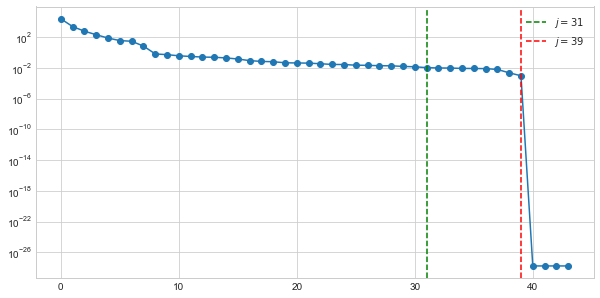

In [94]:
plt.figure(figsize = (10,5))

plt.semilogy(pca.explained_variance_, '-o')
plt.axvline(x=31, c='g', ls='--', label=r'$j=31$')
plt.axvline(x=39, c='r', ls='--', label=r'$j=39$')

plt.legend()

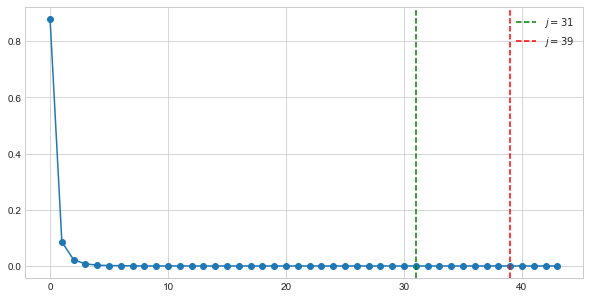

In [95]:
plt.figure(figsize = (10,5))

plt.plot(pca.explained_variance_ratio_, '-o')
plt.axvline(x=31, c='g', ls='--', label=r'$j=31$')
plt.axvline(x=39, c='r', ls='--', label=r'$j=39$')
plt.legend()

Text(0.5, 1.0, 'Second Principal Component Axis')

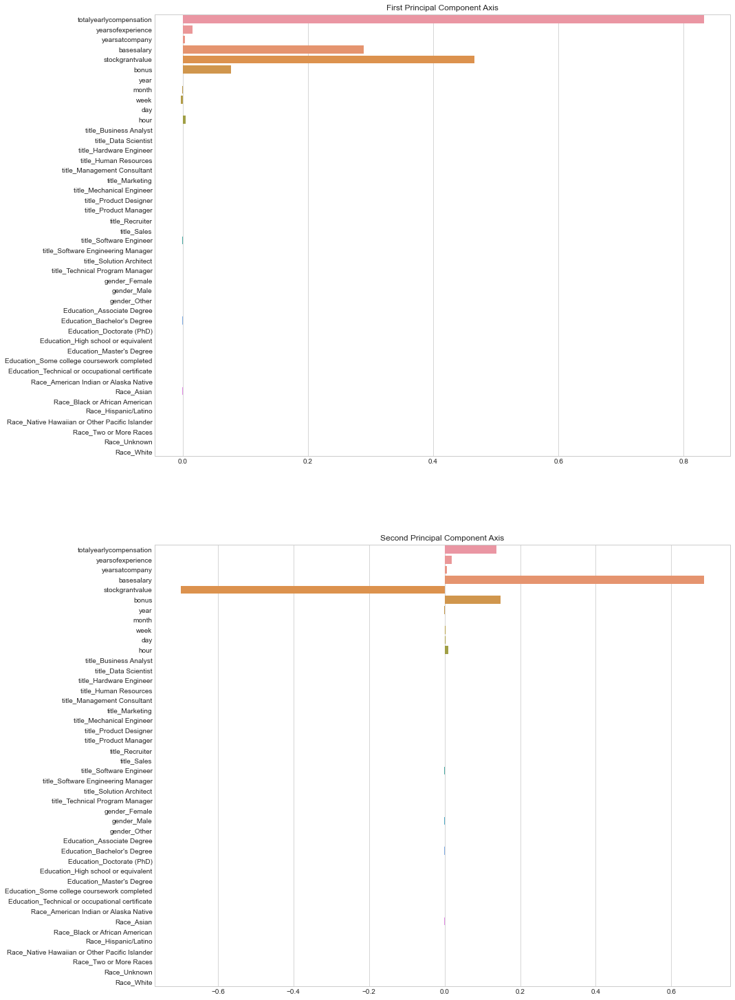

In [96]:
fig, ax = plt.subplots(2, 1, figsize=(15, 26))
sns.barplot(x=pca.components_[0], y=salaries_clean.columns, orient='h', ax=ax[0])
sns.barplot(x=pca.components_[1], y=salaries_clean.columns, orient='h', ax=ax[1])

ax[0].set_title('First Principal Component Axis')
ax[1].set_title('Second Principal Component Axis')

It appears that everything is dominated by either the stockgrantvalue or the basesalary.

This make sense, since these numbers are on the order much higher than the other features. Then, of course the majority of the variance is going to be dominated by these features. This is undesirable. 

To resolve this, let us use `sklearn.preprocessing` module to normalize the data.

In [97]:
# from sklearn.preprocessing import minmax_scale
salaries_clean_normalized = (salaries_clean - salaries_clean.min()) / (
    salaries_clean.max() - salaries_clean.min())

In [98]:
pca.fit(salaries_clean_normalized)

PCA()

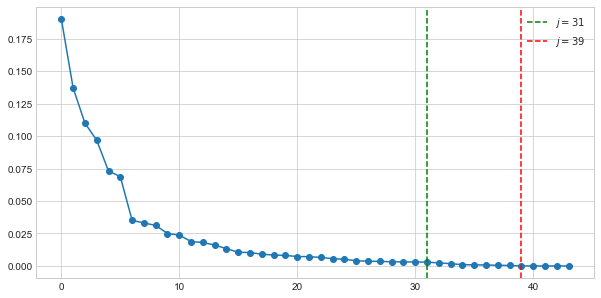

In [99]:
plt.figure(figsize = (10,5))
plt.plot(pca.explained_variance_ratio_, '-o')
plt.axvline(x=31, c='g', ls='--', label=r'$j=31$')
plt.axvline(x=39, c='r', ls='--', label=r'$j=39$')
plt.legend()

Text(0.5, 1.0, 'Third Principal Component Axis')

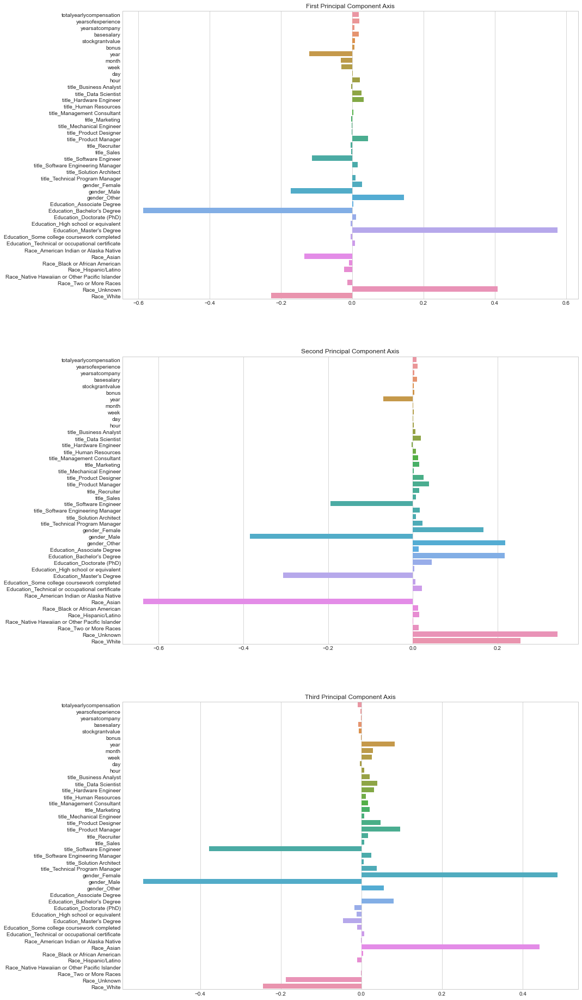

In [100]:
fig, ax = plt.subplots(3, 1, figsize=(15, 33))
sns.barplot(x=pca.components_[0], y=salaries_clean.columns, orient='h', ax=ax[0])
sns.barplot(x=pca.components_[1], y=salaries_clean.columns, orient='h', ax=ax[1])
sns.barplot(x=pca.components_[2], y=salaries_clean.columns, orient='h', ax=ax[2])

ax[0].set_title('First Principal Component Axis')
ax[1].set_title('Second Principal Component Axis')
ax[2].set_title('Third Principal Component Axis')

### Unsupervised Binning:

Unsupervised binning is a category of binning that transforms a numerical or continuous variable into categorical bins **without considering the target class label into account.**

Unsupervised binning are of two categories:
* Equal width binning (What I will be implementing here)
* Equal frequency binning


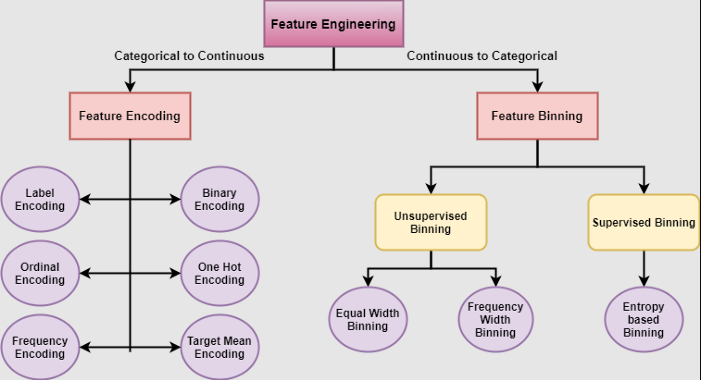

In [101]:
max_sal = salaries_clean['totalyearlycompensation'].max()
min_sal = salaries_clean['totalyearlycompensation'].min()
print(max_sal)
print(min_sal)

1733.0
10.0


In [102]:
# Split into 11 bins
bin_11 = np.arange(min_sal, max_sal+100, 160)
print('Total bin to split =', (len(bin_11)-1))
bin_11

Total bin to split = 11


array([  10.,  170.,  330.,  490.,  650.,  810.,  970., 1130., 1290.,
       1450., 1610., 1770.])

In [103]:
labels_11_count = np.arange(1, len(bin_11), 1)
labels_11_count

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [104]:
labels_11 = []
for i, j in enumerate(bin_11):
    
    if (i+1)<len(bin_11):
        if i == 0:
            start = str(int(bin_11[i]))
            end = str(int(bin_11[i+1]))

        else: 
            start = str(int(bin_11[i]+1))
            end = str(int(bin_11[i+1]))

        labels_11.append(str(start) +'-'+ str(end))   
labels_11    

['10-170',
 '171-330',
 '331-490',
 '491-650',
 '651-810',
 '811-970',
 '971-1130',
 '1131-1290',
 '1291-1450',
 '1451-1610',
 '1611-1770']

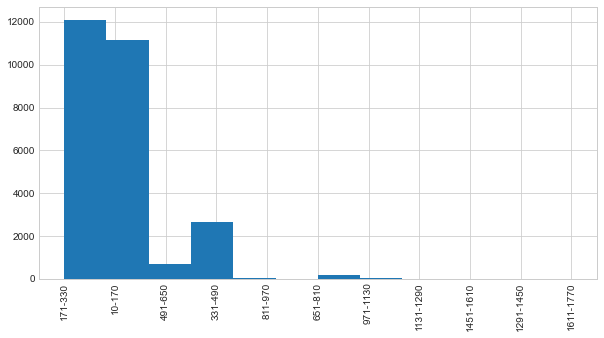

In [105]:

salaries_clean['compensation_bins_11'] = pd.cut(salaries_clean['totalyearlycompensation'], 
                                           bins= bin_11, labels= labels_11, include_lowest=True)
plt.figure(figsize = (10,5))
plt.hist(salaries_clean['compensation_bins_11'], bins=len(bin_11-1))
plt.xticks(rotation='vertical')
plt.show()

In [106]:
# salaries[['totalyearlycompensation','compensation_bins_11']]

In [107]:
salaries_clean['compensation_bins_11'].value_counts()

171-330      12085
10-170       11144
331-490       2658
491-650        699
651-810        189
811-970         65
971-1130        20
1131-1290       19
1291-1450        5
1451-1610        4
1611-1770        2
Name: compensation_bins_11, dtype: int64

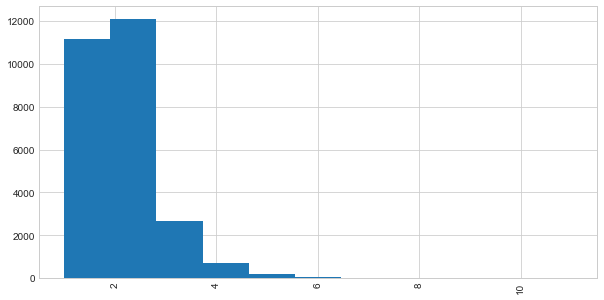

In [108]:
salaries_clean['compensation_bins'] = pd.cut(salaries_clean['totalyearlycompensation'], 
                                           bins= bin_11, labels= labels_11_count, include_lowest=True)
plt.figure(figsize = (10,5))
plt.hist(salaries_clean['compensation_bins'], bins=len(labels_11_count))
plt.xticks(rotation='vertical')
plt.show()

In [109]:
salaries_clean['compensation_bins'].value_counts()

2     12085
1     11144
3      2658
4       699
5       189
6        65
7        20
8        19
9         5
10        4
11        2
Name: compensation_bins, dtype: int64

In [110]:
# Check binning is done correctly
labels_bin = salaries_clean[['totalyearlycompensation', 'compensation_bins_11', 'compensation_bins']]
labels_bin.head(50)

,totalyearlycompensation,compensation_bins_11,compensation_bins
0,242.0,171-330,2
1,172.0,171-330,2
2,255.0,171-330,2
3,144.0,10-170,1
4,515.0,491-650,4
5,169.0,10-170,1
6,240.0,171-330,2
7,220.0,171-330,2
8,455.0,331-490,3
9,136.0,10-170,1


### Process data

In [111]:
features = salaries_clean.drop(labels_bin, axis=1)
labels = salaries_clean[['compensation_bins']]
labels_flatten = labels.values.ravel()
label = 'compensation_bins'

In [112]:
# test classification dataset
from collections import Counter
# summarize the dataset
print(features.shape, labels_flatten.shape)
print(Counter(labels_flatten))

(26890, 43) (26890,)
Counter({2: 12085, 1: 11144, 3: 2658, 4: 699, 5: 189, 6: 65, 7: 20, 8: 19, 9: 5, 10: 4, 11: 2})


In [113]:
# Convert to numpy array
features_np = features.values
features_np

array([[  8.,   1., 187., ...,   0.,   1.,   0.],
       [  5.,   0., 135., ...,   0.,   1.,   0.],
       [  5.,   0., 165., ...,   0.,   1.,   0.],
       ...,
       [  9.,   0., 150., ...,   0.,   0.,   0.],
       [  0.,   0.,  85., ...,   0.,   0.,   1.],
       [  5.,   0., 180., ...,   0.,   0.,   0.]])

In [114]:
# Convert to numpy array
labels_np = labels.values.ravel()
labels_np

array([2, 2, 2, ..., 2, 1, 2], dtype=int64)

### Standard Scalar to normalized the features

In [115]:
X_train, X_test, y_train, y_test = train_test_split(
    features_np, labels_np, test_size=0.3,
    stratify= labels_np, random_state=0
)
# standardize the features
sc = StandardScaler()
X_train_std = sc.fit_transform(X_train)
X_test_std = sc.transform(X_test)

# Unsupervised Learning 
## Topic 1: Principal Component Analysis (PCA)

In [116]:
cov_mat = np.cov(X_train_std.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

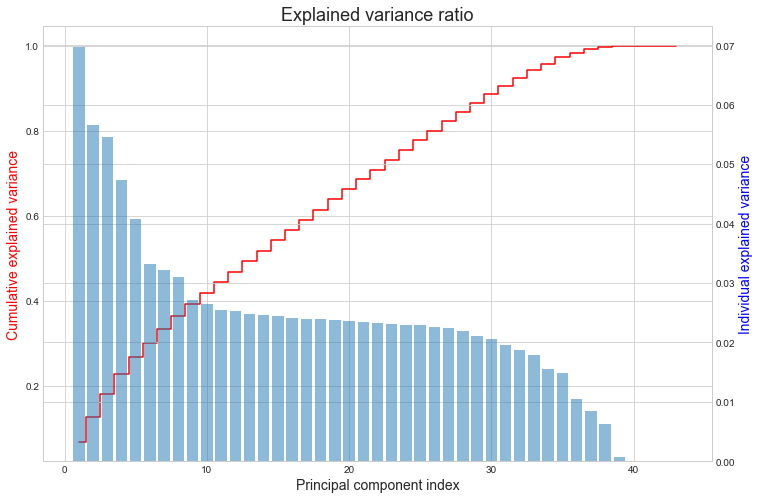

In [117]:
import matplotlib.pyplot as plt

# calculate cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
# create figure and axis objects with subplots()
fig,ax = plt.subplots(figsize=(12, 8))

ax.step(range(1,44), cum_var_exp, where='mid',
         label='cumulative explained variance',color="red")

# set x-axis label
ax.set_xlabel("Principal component index",fontsize=14)
# set y-axis label
ax.set_ylabel("Cumulative explained variance",color="red",fontsize=14)
# twin object for two different y-axis on the sample plot
ax2=ax.twinx()
# make a plot with different y-axis using second axis object
ax2.bar(range(1,44), var_exp, alpha=0.5,
        align='center', label='individual explained variance')

ax2.set_ylabel("Individual explained variance",color="blue",fontsize=14)
plt.title('Explained variance ratio', fontsize=18)
plt.show()

The resulting plot indicates that the first principal component alone accounts only for approximately 7% of the variance. The second and third principal component accounts for pproximtely 5.5%. 

Also, we can see that around first 34 principal components combined, gives us explain variance of 95% (approximately) of the variance in the dataset.

### Feature Transformation
After we have successfully decomposed the covariance matrix into eigenpairs, we now proceed to transform the dataset onto the new principal component axes.

We will sort the eigenpairs by descending order of the eigenvalues, construct a projection matrix from the selected eigenvectors, and use the projection matrix to transform the data onto the lower-dimensional subspace.

We start by sorting the eigenpairs by decreasing order of the eigenvalues:

In [118]:
# Make a list of (eigenvalue, eigenvector) tuples
eigen_pairs = [(np.abs(eigen_vals[i]), eigen_vecs[:, i]) for i in range(len(eigen_vals))]

# Sort the (eigenvalue, eigenvector) tuples from high to low
eigen_pairs.sort(key=lambda k: k[0], reverse=True)

Next, we collect the two eigenvectors that correspond to the two largest eigenvalues, to capture about 60% of the variance in this dataset. Note that we only chose two eigenvectors for the purpose of illustration, since we are going to plot the data via a two-dimensional scatter plot later in this subsection. 

In practice, the number of principal components has to be determined by a trade-off between computational efficiency and the performance of the classifier:

In [119]:
w = np.hstack((eigen_pairs[0][1][:, np.newaxis], eigen_pairs[1][1][:, np.newaxis]))
print('Matrix W:\n', w)

Matrix W:
 [[ 3.26446619e-01  1.66138055e-01]
 [ 2.03833046e-01  1.32486343e-01]
 [ 3.62670847e-01  1.04199662e-01]
 [ 2.76535276e-01  1.16720975e-01]
 [ 2.64410437e-01  7.64908653e-02]
 [-1.81239628e-01  4.75994653e-01]
 [-7.28286532e-03 -5.47532570e-01]
 [-5.82718329e-03 -5.46809718e-01]
 [ 1.95319854e-03 -4.46398622e-03]
 [ 6.78279729e-02  2.13473894e-03]
 [-3.34600749e-02 -2.51149594e-02]
 [ 3.99451880e-02 -2.28758988e-02]
 [ 7.93450170e-02  7.78368760e-03]
 [ 1.45235374e-02 -1.39637166e-02]
 [ 4.45047186e-05 -8.80142769e-03]
 [ 4.04277553e-03 -1.77110118e-02]
 [-5.77968928e-03 -1.51685221e-02]
 [ 8.38440869e-03 -2.36538797e-02]
 [ 1.14287478e-01  1.52670042e-02]
 [-1.65312344e-02 -2.28734624e-02]
 [ 1.20584457e-02 -2.03730988e-02]
 [-2.31445364e-01 -3.73641905e-02]
 [ 1.87248140e-01  1.13891279e-01]
 [ 3.06386734e-02  3.84414284e-02]
 [ 8.00594978e-02  1.98920199e-02]
 [-7.26072774e-03 -1.11697882e-01]
 [-1.46137778e-01  1.62510632e-01]
 [ 2.20518669e-01 -1.00439071e-01]
 [ 9.9276

In [120]:
# By executing the preceding code, we have created a 542 x 2-dimensional projection matrix W 
# from the top two eigenvectors.
w.shape

(43, 2)

By executing the preceding code, we have created a 43 x 2-dimensional projection matrix W from the top two eigenvectors.
Using the projection matrix, we can now transform a sample x (represented as a 1 x 43-dimensional row vector) onto the PCA subspace (the principal components one and two) obtaining x′, now a two-dimensional sample vector consisting of two new features:



In [121]:
X_train_std[0].dot(w)

array([ 1.57977543, -2.06037485])

Similarly, we can transform the entire 18823 x 43-dimensional training dataset onto the two principal components by calculating the matrix dot product:


In [122]:
X_train_pca = X_train_std.dot(w)
X_train_pca

array([[ 1.57977543, -2.06037485],
       [ 2.60603497,  1.91658756],
       [-0.13680263, -1.17811988],
       ...,
       [-0.61512195,  2.30054692],
       [ 1.84093423, -1.30480511],
       [-0.27282681,  0.68244568]])

In [123]:
X_train_pca.shape

(18823, 2)

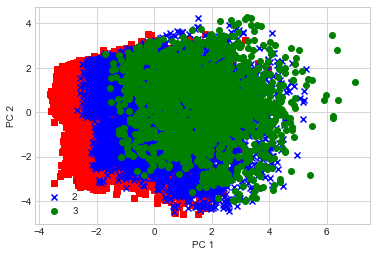

In [124]:
colors = ['r', 'b', 'g']
markers = ['s', 'x', 'o']
for l, c, m in zip(np.unique(y_train), colors, markers):
    plt.scatter(X_train_pca[y_train==l, 0], 
                X_train_pca[y_train==l, 1],
                c=c, label=l, marker=m) 
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='lower left')
plt.show()

## Perform Hyperameter tuning for PCA

Let us now perform PCA. For demonstration we will only work with the training set and evaluate our performance on the test set. In general, depending on the task at hand this splitting may be unnecesssary. For example, if we are interested in compression or feature extraction then there is no need for a train-test split.

Here, we will use the `sklearn.decomposition.PCA` class to perform PCA.

In [125]:
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA

### Before hyperameter tuning

* I use multinomial class because I have a total of 11 bins (categories)

In [126]:
# fit and transform data

# Before hyperparameter tuning with n_components = 2
# lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter= 1000)
# pca = PCA(n_components = 2)
# X_train_pca = pca.fit_transform(X_train_std)
# X_test_pca = pca.transform(X_test_std)

# lr.fit(X_train_pca, y_train)
# display(lr.score(X_train_pca, y_train))

In [127]:
# Before hyperparameter tuning with n_components = 5
lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter= 1200)
pca = PCA(n_components = 5)
X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)

lr.fit(X_train_pca, y_train)
display(lr.score(X_train_pca, y_train))

0.6536683844233119

In [128]:
clf = Pipeline([
    ("pca", PCA(n_components=2)),
    ("log_reg", LogisticRegression(multi_class='multinomial'))
    ])

param_grid = [{
    "pca__svd_solver": ['auto', 'randomized'], #np.linspace(0.03, 0.05, 1),
    
    "log_reg__max_iter": [1200, 1400],
    "log_reg__penalty": ['l2'],
    "log_reg__solver": ['lbfgs', 'saga'],
    }]

grid_search = GridSearchCV(clf, param_grid, cv=3)
grid_search.fit(X_train_std, y_train)

print(grid_search.best_params_)

C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_split.py:666: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=3.



{'log_reg__max_iter': 1400, 'log_reg__penalty': 'l2', 'log_reg__solver': 'saga', 'pca__svd_solver': 'randomized'}


In [129]:
param_dict = print_best_params(grid_search)


*** Pipeline Best Parameters ***
memory: None
steps: [('pca', PCA(n_components=2, svd_solver='randomized')), ('log_reg', LogisticRegression(max_iter=1400, multi_class='multinomial', solver='saga'))]
verbose: False
pca: PCA(n_components=2, svd_solver='randomized')
log_reg: LogisticRegression(max_iter=1400, multi_class='multinomial', solver='saga')
pca__copy: True
pca__iterated_power: auto
pca__n_components: 2
pca__random_state: None
pca__svd_solver: randomized
pca__tol: 0.0
pca__whiten: False
log_reg__C: 1.0
log_reg__class_weight: None
log_reg__dual: False
log_reg__fit_intercept: True
log_reg__intercept_scaling: 1
log_reg__l1_ratio: None
log_reg__max_iter: 1400
log_reg__multi_class: multinomial
log_reg__n_jobs: None
log_reg__penalty: l2
log_reg__random_state: None
log_reg__solver: saga
log_reg__tol: 0.0001
log_reg__verbose: 0
log_reg__warm_start: False

0.6070239 (+/-0.017) for {'log_reg__max_iter': 1200, 'log_reg__penalty': 'l2', 'log_reg__solver': 'lbfgs', 'pca__svd_solver': 'auto'}


In [130]:
best_svd_solver = param_dict['pca__svd_solver']

best_log_reg_max_iter = param_dict['log_reg__max_iter']
best_log_reg__penalty = param_dict['log_reg__penalty']
best_log_reg__solver = param_dict['log_reg__solver']

In [131]:
# # After hyperparameter tuning with n_components = 10
# lr = LogisticRegression(multi_class= 'multinomial', solver= best_log_reg__solver, 
#                         max_iter= best_log_reg_max_iter, penalty= best_log_reg__penalty)

# pca = PCA(n_components = 2, svd_solver = best_svd_solver)

# X_train_pca = pca.fit_transform(X_train_std)
# X_test_pca = pca.transform(X_test_std)

# lr.fit(X_train_pca, y_train)
# display(lr.score(X_train_pca, y_train))

### After hyperameter tuning

In [132]:
# Before hyperparameter tuning with n_components = 5 (chose 5 here because 10 is taking a very long time)
lr = LogisticRegression(multi_class= 'multinomial', solver= best_log_reg__solver, 
                        max_iter= best_log_reg_max_iter, penalty= best_log_reg__penalty)

pca = PCA(n_components = 5, svd_solver = best_svd_solver)

X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)

lr.fit(X_train_pca, y_train)
display(lr.score(X_train_pca, y_train))

0.6510120597141794

We see that the results **did NOT improve even AFTER hyperparameter was tuned**. I will perform Kernal PCA (second part) so that non-linear dimensionality reduction can be achieve (through the use of kernels).

We will see scatter plot below when project based on its principal component 1 and 2.

In [133]:
# With the tune parameter, we can plot to see when first 2 PCA components are used.
lr = LogisticRegression(multi_class= 'multinomial', solver= best_log_reg__solver, 
                        max_iter= best_log_reg_max_iter, penalty= best_log_reg__penalty)

pca = PCA(n_components = 2, svd_solver = best_svd_solver)

X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)

lr.fit(X_train_pca, y_train)
display(lr.score(X_train_pca, y_train))

0.607660840461138

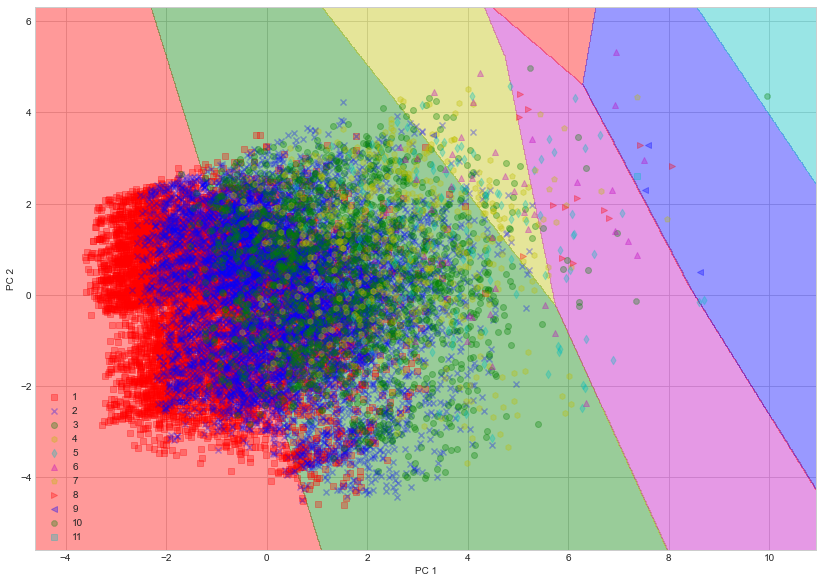

In [134]:
from matplotlib.colors import ListedColormap

def plot_decision_regions(X, y, classifier, resolution=0.02):
    # setup marker generator and color map
#     markers = ('s', 'x', 'o', '^', 'v')
#     colors = ('red', 'blue', 'lightgreen', 'gray', 'cyan')
    colors = ['r', 'b', 'g', 'y', 'c', 'm', 'y', 'r', 'b', 'g', 'c']
    markers = ['s', 'x', 'o', 'h', 'd', '^', 'p', '>', '<', '8', ',']
    cmap = ListedColormap(colors[:len(np.unique(y))])

    # plot the decision surface
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, resolution),
                           np.arange(x2_min, x2_max, resolution))
    Z = classifier.predict(np.array([xx1.ravel(), xx2.ravel()]).T)
    Z = Z.reshape(xx1.shape)
    plt.contourf(xx1, xx2, Z, alpha=0.4, cmap=cmap)
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())

    # plot class samples
    for idx, cl in enumerate(np.unique(y)):
        plt.scatter(x=X[y == cl, 0], 
                    y=X[y == cl, 1],
                    alpha=0.3, 
                    c=[cmap(idx)],
#                     edgecolor='black',
                    marker=markers[idx], 
                    label=cl)# plot decision regions for training set

plt.figure(figsize = (14,10))
plot_decision_regions(X_train_pca, y_train, classifier=lr)
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.legend(loc='lower left')
plt.show()

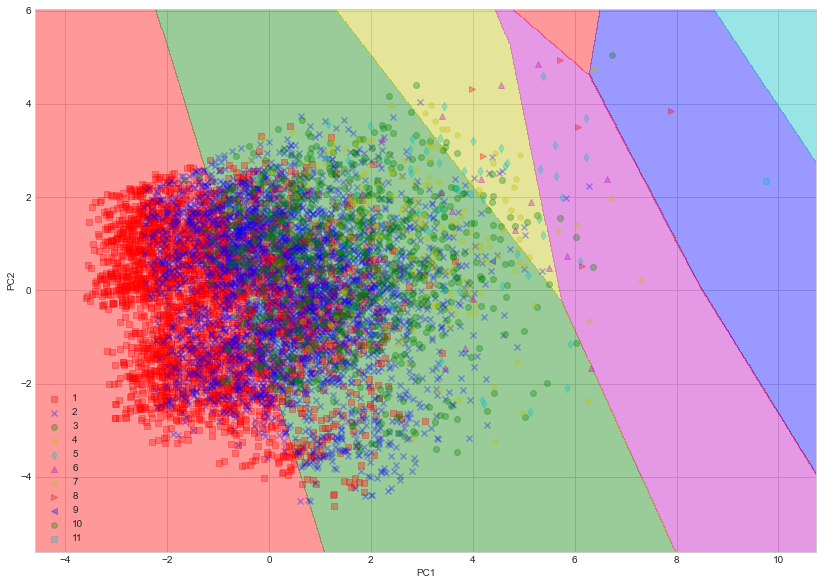

In [135]:

# plot decision regions for test set
plt.figure(figsize = (14,10))
plot_decision_regions(X_test_pca, y_test, classifier=lr)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(loc='lower left')
plt.show()

### Obseravtion:

* Above scatter plot showed a total of 7 partition instead of 11 (total bins = 11). This is due to some bins have very small value (almost negligible) compared to the other bins. As plotted in figure above (only 7 bins can be seen with values):

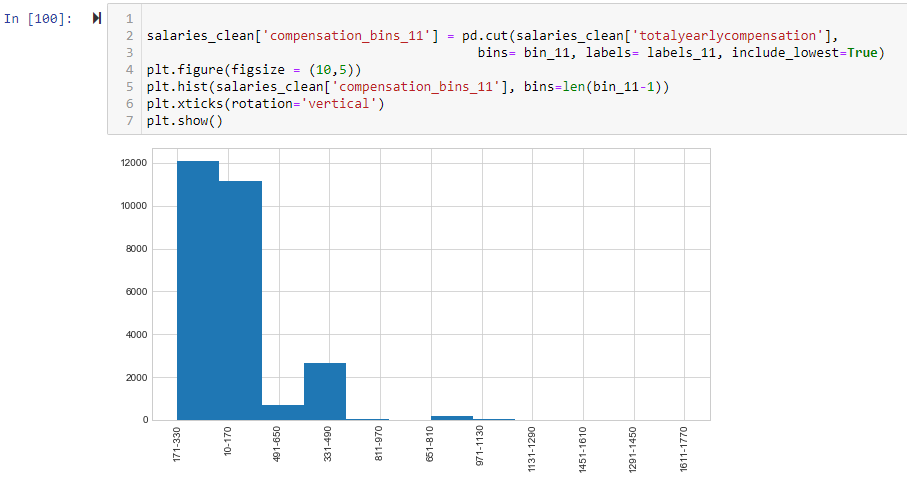

* Also, it is clear that the dataset are not linearly separable from a 2D point of view. It requireds around 34 pricipal component in order to linearly separate them to obtain 95% vraiance (as shown below).

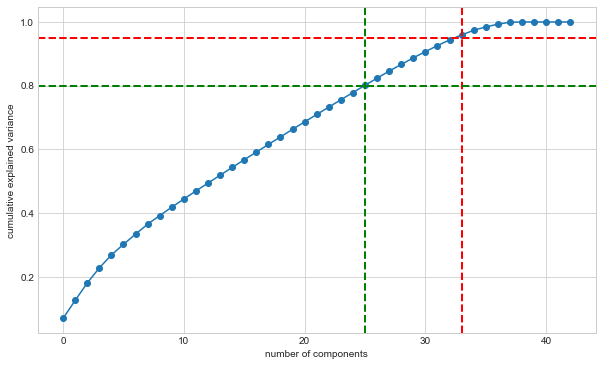

None

In [136]:
# Similar to above, I passed in all 43 features into the PCA model to see its performanced
# This graph shows that after more than 34 components, we don’t gain very much explained variance.
pca_test = PCA(n_components=43)
pca_test.fit(X_train_std)

# sns.set(style='whitegrid')
plt.figure(figsize = (10,6))
plt.plot(np.cumsum(pca_test.explained_variance_ratio_), '-o')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

# See that with 34 PC, we can get around 95% variance
plt.axvline(linewidth=2, color='r', linestyle = '--', x=33, ymin=0, ymax=1)
plt.axhline(linewidth=2, color='r', linestyle = '--', y=0.95, xmin=0, xmax=43)

# See that with 26 PC, we can get around 80% variance
plt.axvline(linewidth=2, color='g', linestyle = '--', x=25, ymin=0, ymax=1)
plt.axhline(linewidth=2, color='g', linestyle = '--', y=0.8, xmin=0, xmax=43)
display(plt.show())

evr = pca_test.explained_variance_ratio_
cvr = np.cumsum(pca_test.explained_variance_ratio_)

pca_df = pd.DataFrame()
pca_df['Cumulative Variance Ratio'] = cvr
pca_df['Explained Variance Ratio'] = evr


This 'pca_df' dataframe shows:
1. Cumulative Variance Ratio (how much total variance of the data is explained) 
2. Explained Variance Ratio (how much each PCA component explains the total variance of the data).

In [137]:
# I am showing PCA from 20 onwards, with 21 components, we manage to achieve 70% variance.
# display(pca_df.head(43))
pca_df[20:]

,Cumulative Variance Ratio,Explained Variance Ratio
20,0.686469,2.343759e-02
21,0.709749,2.327930e-02
22,0.732833,2.308465e-02
23,0.755801,2.296782e-02
24,0.778664,2.286244e-02
25,0.801295,2.263187e-02
26,0.823776,2.248093e-02
27,0.845729,2.195279e-02
28,0.866802,2.107254e-02
29,0.887400,2.059849e-02


Looking at the dataframe above, when we use PCA to reduce our 43 predicting variables down to 34 components, we can still explain over 95% of the variance. 



We can also approach this **process another way** to check for the number of PC required in order to acheiev the variance we would like to have explained.

Example for 95% and 80% variance:

In [138]:
pca = PCA(n_components = 0.95)
pca.fit(X_train_std)
x_pca = pca.transform(X_train_std)
print('Total number of PCA required to achive 95% variance:', pca.n_components_)

Total number of PCA required to achive 95% variance: 34


In [139]:
pca = PCA(n_components = 0.8)
pca.fit(X_train_std)
x_pca = pca.transform(X_train_std)
print('Total number of PCA required to achive 80% variance:', pca.n_components_)

Total number of PCA required to achive 80% variance: 26


The remaining components explain less than 5% of the variance (after PC 34), so we can actually remove them. Using this logic, we will use PCA to reduce the number of components from 43 to 34 for X_train and X_test. We will assign these recreated, “reduced dimension” datasets to “X_train_pca_reduce” and “X_test_pca_reduce”.

Now, we can fit our X_train_scaled_pca and y_train data to the same “baseline” machine learning model, to see if we get any improvement on the model’s predictions.

In [140]:
label

'compensation_bins'

In [141]:
columns = features.columns
columns.shape

(43,)

Each component is a linear combination of the original variables with corresponding “weights”. We can see these “weights” for each PCA component by creating a dataframe.

In [142]:
pca_dims = []
for x in range(0, len(pca_df)):
    pca_dims.append('PC{}'.format(x))
#     pca_dims.append('PCA Component {}'.format(x))
pca_test_df = pd.DataFrame(pca_test.components_, columns=columns, index=pca_dims)
pca_test_df.head(33).T

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32
yearsofexperience,0.326447,0.166138,0.303352,0.062478,-0.049694,-0.025919,-0.192930,0.118772,-0.009240,-0.106603,...,-0.001621,-0.024395,0.038440,0.006665,-0.031285,-0.025835,0.166688,-0.173151,-0.001803,-0.038824
yearsatcompany,0.203833,0.132486,0.228365,0.048850,-0.073114,-0.100868,-0.159107,0.153872,-0.090631,-0.279319,...,0.024998,-0.034683,0.098284,-0.049370,-0.025930,-0.144196,0.373030,-0.432786,0.156952,0.083768
basesalary,0.362671,0.104200,0.173759,-0.021351,0.092510,0.270280,0.048643,-0.102057,0.038150,0.076316,...,0.021251,-0.064282,0.009248,-0.067074,-0.075522,0.144039,-0.042866,0.017330,0.022925,-0.198680
stockgrantvalue,0.276535,0.116721,0.170042,-0.054759,0.110290,0.346328,0.065969,-0.019319,0.039121,0.068688,...,0.009215,0.051482,-0.062069,0.025747,-0.043938,0.162525,-0.092783,0.088106,0.048668,-0.146319
bonus,0.264410,0.076491,0.190599,0.008029,0.030116,0.201140,0.078247,0.007838,-0.115793,0.097616,...,-0.009293,-0.022921,0.032905,-0.020621,-0.051823,0.160031,-0.156228,0.060078,-0.127274,-0.156975
year,-0.181240,0.475995,-0.069426,0.140064,-0.083869,0.046974,0.003831,0.091135,0.051585,-0.029226,...,-0.039803,0.044413,-0.041115,-0.002049,-0.011673,0.061201,-0.064544,0.003806,0.144010,-0.169901
month,-0.007283,-0.547533,0.284818,-0.020076,-0.034595,0.021995,-0.014520,0.087913,0.035766,-0.026213,...,-0.016461,0.023882,-0.013251,-0.005190,0.001465,0.012632,-0.021426,-0.002496,0.076173,-0.063825
week,-0.005827,-0.546810,0.286579,-0.021142,-0.030890,0.024516,-0.010967,0.087987,0.030753,-0.025808,...,0.008720,0.009218,-0.037757,0.006456,-0.001053,0.013711,-0.020266,0.002326,0.077648,-0.069068
day,0.001953,-0.004464,-0.006804,-0.015732,0.007237,-0.015166,0.000167,0.014354,-0.061777,0.022431,...,0.399528,-0.205965,-0.326651,0.253329,-0.027563,0.001247,0.051165,0.028247,0.046777,-0.049669
hour,0.067828,0.002135,0.002196,-0.023191,0.004086,0.165340,0.076287,-0.059243,-0.019185,0.219796,...,0.005041,-0.281080,-0.169445,-0.363158,0.461336,-0.254981,-0.046990,-0.055856,0.086776,0.140752


In [143]:
pca_test_df.T

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,...,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42
yearsofexperience,0.326447,0.166138,0.303352,0.062478,-0.049694,-0.025919,-0.192930,0.118772,-0.009240,-0.106603,...,-0.039660,-0.024940,0.229446,-0.756517,-0.020574,0.000487,6.966616e-17,0.000000e+00,0.000000e+00,0.000000e+00
yearsatcompany,0.203833,0.132486,0.228365,0.048850,-0.073114,-0.100868,-0.159107,0.153872,-0.090631,-0.279319,...,0.050877,0.029264,-0.252580,0.456897,-0.001170,0.000971,-9.377715e-17,8.115793e-17,4.934381e-17,6.060931e-17
basesalary,0.362671,0.104200,0.173759,-0.021351,0.092510,0.270280,0.048643,-0.102057,0.038150,0.076316,...,-0.060438,0.084991,0.673906,0.393361,0.031511,-0.002365,8.641612e-17,-8.845851e-17,1.358511e-16,-8.009432e-17
stockgrantvalue,0.276535,0.116721,0.170042,-0.054759,0.110290,0.346328,0.065969,-0.019319,0.039121,0.068688,...,-0.588506,0.065967,-0.526650,-0.016354,0.003903,-0.004251,4.735387e-17,-6.257165e-17,-1.152731e-16,6.441497e-17
bonus,0.264410,0.076491,0.190599,0.008029,0.030116,0.201140,0.078247,0.007838,-0.115793,0.097616,...,0.671441,0.175417,-0.315861,-0.031468,-0.009262,-0.000279,2.546526e-18,1.044673e-16,1.003305e-16,-4.478274e-18
year,-0.181240,0.475995,-0.069426,0.140064,-0.083869,0.046974,0.003831,0.091135,0.051585,-0.029226,...,0.029119,-0.263665,0.015857,0.045624,-0.731554,-0.006807,1.690711e-17,4.656278e-17,1.465739e-16,5.485970e-17
month,-0.007283,-0.547533,0.284818,-0.020076,-0.034595,0.021995,-0.014520,0.087913,0.035766,-0.026213,...,0.008929,-0.098143,0.006042,0.018864,-0.267915,-0.708739,-3.041891e-16,-4.797441e-16,-5.786549e-16,3.615282e-18
week,-0.005827,-0.546810,0.286579,-0.021142,-0.030890,0.024516,-0.010967,0.087987,0.030753,-0.025808,...,0.004480,-0.097104,0.003976,0.019937,-0.284237,0.703807,3.771130e-16,4.636016e-16,7.327563e-16,-1.264045e-16
day,0.001953,-0.004464,-0.006804,-0.015732,0.007237,-0.015166,0.000167,0.014354,-0.061777,0.022431,...,-0.003986,0.002126,-0.019466,0.002171,-0.047070,-0.046713,3.283818e-16,5.929570e-17,-4.483891e-16,-1.112608e-16
hour,0.067828,0.002135,0.002196,-0.023191,0.004086,0.165340,0.076287,-0.059243,-0.019185,0.219796,...,0.040899,-0.091837,-0.076444,-0.089518,-0.020795,-0.002819,1.188979e-16,8.506157e-17,-1.664088e-16,-1.316276e-17


In [144]:
# Score achieveable when using all PCs = 98%
pca = PCA(n_components = 43)
X_train_pca = pca.fit_transform(X_train_std)
X_test_pca = pca.transform(X_test_std)
lr.fit(X_train_pca, y_train)
display(lr.score(X_train_pca, y_train))

0.9845933166870319

In [145]:
# Overhere, we show that the score achieveable by using 34 PCs is around 92%
pca_reduce = PCA(n_components=34)
# pca_reduce.fit(X_train_std)
X_train_pca_reduce = pca_reduce.fit_transform(X_train_std)
X_test_pca_reduce = pca_reduce.transform(X_test_std)
lr.fit(X_train_pca_reduce, y_train)
display(lr.score(X_train_pca_reduce, y_train))

0.9121287786218988

#### Observe that the model still have very good performance even after removing 10 principal components from 43 to 34.

### Principal component (PC) retentionPermalink

* As the number of PCs is equal to the number of original variables, We should keep only the PCs which explain the most variance (70-95%) to make the interpretation easier. More the PCs you include that explains most variation in the original data, better will be the PCA model. This is highly subjective and based on the user interpretation.

* The eigenvalues (variance explained by each PC) for PCs can help to retain the number of PCs. Generally, PCs with eigenvalues > 1 contributes greater variance and should be retained for further analysis.

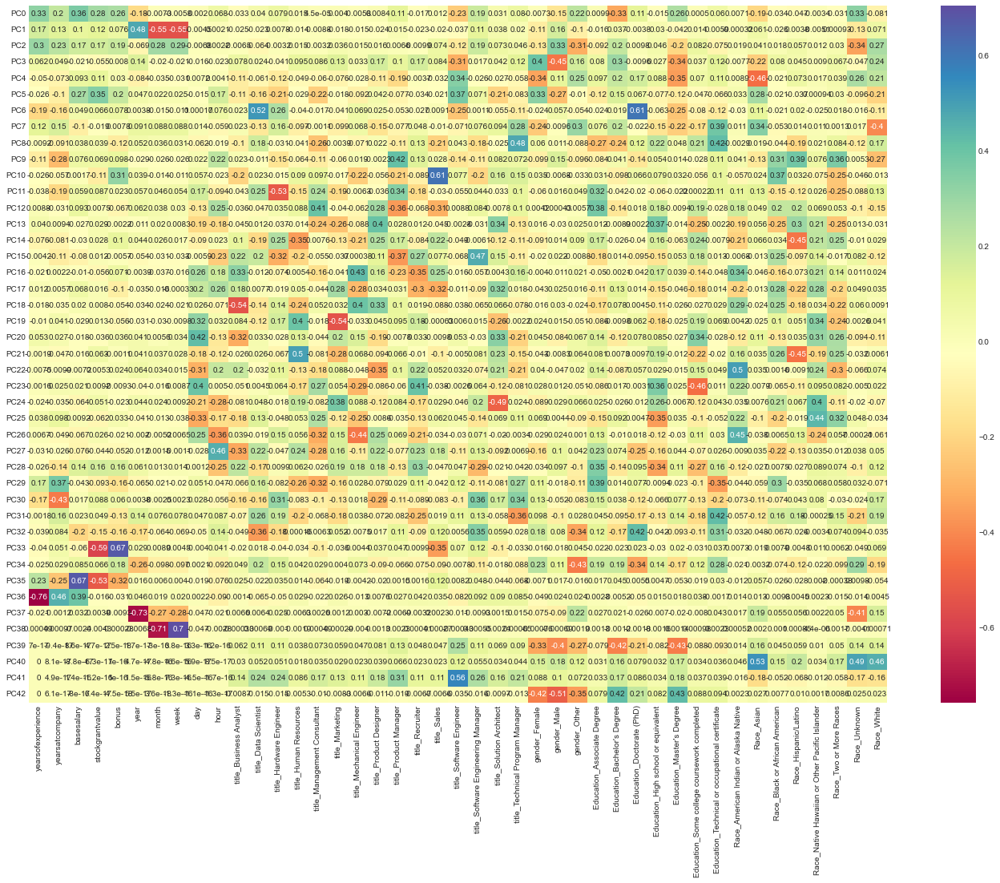

In [146]:
plt.figure(figsize = (24,16))
ax = sns.heatmap(pca_test_df, annot=True, cmap='Spectral')
plt.show()

In [147]:
# eigenvalues (variance explained by each PC)  
pca_test.explained_variance_

array([2.99660509e+00, 2.43506176e+00, 2.34674798e+00, 2.03450247e+00,
       1.75277312e+00, 1.42683878e+00, 1.38664506e+00, 1.33502026e+00,
       1.16536103e+00, 1.13560864e+00, 1.09668217e+00, 1.08622508e+00,
       1.06699043e+00, 1.05783229e+00, 1.05173464e+00, 1.03933956e+00,
       1.03312291e+00, 1.02927790e+00, 1.02264574e+00, 1.01286741e+00,
       1.00786981e+00, 1.00106295e+00, 9.92692709e-01, 9.87668661e-01,
       9.83137089e-01, 9.73222015e-01, 9.66731368e-01, 9.44020079e-01,
       9.06167448e-01, 8.85782317e-01, 8.43865839e-01, 8.06645303e-01,
       7.68432193e-01, 6.66341153e-01, 6.38136553e-01, 4.53170921e-01,
       3.61317992e-01, 2.72344221e-01, 3.17936226e-02, 3.02566791e-30,
       9.49194609e-32, 6.19196490e-32, 1.44122038e-32])

In [148]:
pca_reduce.explained_variance_

array([2.99660509, 2.43506176, 2.34674798, 2.03450247, 1.75277312,
       1.42683878, 1.38664506, 1.33502026, 1.16536103, 1.13560864,
       1.09668217, 1.08622508, 1.06699043, 1.05783229, 1.05173464,
       1.03933956, 1.03312291, 1.0292779 , 1.02264574, 1.01286741,
       1.00786981, 1.00106295, 0.99269271, 0.98766866, 0.98313709,
       0.97322201, 0.96673137, 0.94402008, 0.90616745, 0.88578232,
       0.84386584, 0.8066453 , 0.76843219, 0.66634115])

# Unsupervised Learning 
## Topic 2: Kernel PCA

Kernel PCA was developed in an effort to help with the classification of data whose decision boundaries are described by non-linear function. The idea is to go to a higher dimension space in which the decision boundary becomes linear.

Which is a better choice for my problem here since my dataset cannot be linearly separable.

In [149]:
from sklearn.decomposition import KernelPCA
from sklearn.utils import extmath

In [150]:
# # Before hyperparameter tuning with n_components = 2
# lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter= 500)
# kpca = KernelPCA(n_components = 2, kernel = "rbf", gamma=0.01, max_iter= 500)

# X_train_kpca = kpca.fit_transform(X_train_std)
# X_test_kpca = kpca.transform(X_test_std)

# lr.fit(X_train_kpca, y_train)
# display(lr.score(X_train_kpca, y_train))

In [151]:
# Before hyperparameter tuning with n_components = 5
lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter= 500)
kpca = KernelPCA(n_components = 5, kernel = "rbf", gamma=0.01, max_iter= 500)

X_train_kpca = kpca.fit_transform(X_train_std)
X_test_kpca = kpca.transform(X_test_std)

lr.fit(X_train_kpca, y_train)
display(lr.score(X_train_kpca, y_train))

0.6097859002284439

### Screenshot of results before hyperparameter tuning (will compare with performance after hyperparameter tuning later

For time purpose, I will run only with n_components = 10

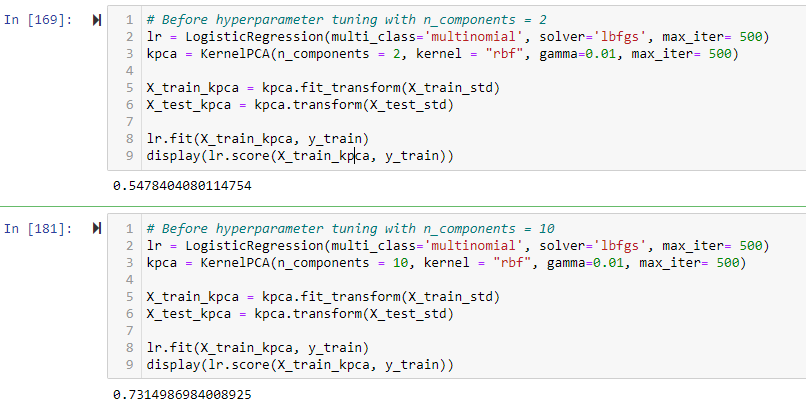

In [152]:
# X_train_kpca = kpca.fit_transform(X_train_std)
# X_test_kpca = kpca.transform(X_test_std)
# lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter= 1000)

clf = Pipeline([
    ("kpca", KernelPCA(n_components=2)),
    ("log_reg", LogisticRegression(multi_class='multinomial', max_iter= 500, solver = 'lbfgs', penalty = 'l2'))
    ])

param_grid = [{
    "kpca__gamma": [0.06, 0.08], #np.linspace(0.03, 0.05, 1),
    "kpca__kernel": ["rbf", "sigmoid"],
    "kpca__max_iter": [250, 300],
    
    "log_reg__max_iter": [500, 600],
#     "log_reg__penalty": ['l2'],
    }]

grid_search = GridSearchCV(clf, param_grid, cv=3)
grid_search.fit(X_train_std, y_train)

print(grid_search.best_params_)

C:\Users\Ron Lim\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_split.py:666: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=3.



{'kpca__gamma': 0.08, 'kpca__kernel': 'sigmoid', 'kpca__max_iter': 250, 'log_reg__max_iter': 600}


In [153]:
param_dict = print_best_params(grid_search)


*** Pipeline Best Parameters ***
memory: None
steps: [('kpca', KernelPCA(gamma=0.08, kernel='sigmoid', max_iter=250, n_components=2)), ('log_reg', LogisticRegression(max_iter=600, multi_class='multinomial'))]
verbose: False
kpca: KernelPCA(gamma=0.08, kernel='sigmoid', max_iter=250, n_components=2)
log_reg: LogisticRegression(max_iter=600, multi_class='multinomial')
kpca__alpha: 1.0
kpca__coef0: 1
kpca__copy_X: True
kpca__degree: 3
kpca__eigen_solver: auto
kpca__fit_inverse_transform: False
kpca__gamma: 0.08
kpca__kernel: sigmoid
kpca__kernel_params: None
kpca__max_iter: 250
kpca__n_components: 2
kpca__n_jobs: None
kpca__random_state: None
kpca__remove_zero_eig: False
kpca__tol: 0
log_reg__C: 1.0
log_reg__class_weight: None
log_reg__dual: False
log_reg__fit_intercept: True
log_reg__intercept_scaling: 1
log_reg__l1_ratio: None
log_reg__max_iter: 600
log_reg__multi_class: multinomial
log_reg__n_jobs: None
log_reg__penalty: l2
log_reg__random_state: None
log_reg__solver: lbfgs
log_reg__t

In [154]:
best_kpca_gamma = param_dict['kpca__gamma']
best_kpca_kernel = param_dict['kpca__kernel']
best_kpca_max_iter = param_dict['kpca__max_iter']
best_log_reg_max_iter = param_dict['log_reg__max_iter']


In [155]:
# # After hyperparameter tuning with n_components = 2
# lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter= best_log_reg_max_iter)
# kpca = KernelPCA(n_components = 2, kernel = best_kpca_kernel, gamma=best_kpca_gamma, max_iter= best_kpca_max_iter)

# X_train_kpca = kpca.fit_transform(X_train_std)
# X_test_kpca = kpca.transform(X_test_std)

# lr.fit(X_train_kpca, y_train)
# display(lr.score(X_train_kpca, y_train))

In [156]:
# After hyperparameter tuning with n_components = 10
lr = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter= best_log_reg_max_iter)
kpca = KernelPCA(n_components = 5, kernel = best_kpca_kernel, gamma=best_kpca_gamma, max_iter= best_kpca_max_iter)

X_train_kpca = kpca.fit_transform(X_train_std)
X_test_kpca = kpca.transform(X_test_std)

lr.fit(X_train_kpca, y_train)
display(lr.score(X_train_kpca, y_train))

0.6602029432077777

### Observations:

We see an improvement of from 61% (hyperparameter not tuned) to 66% (tuned). This improvement although not big but is significantly better compared to PCA model. This value will be increase if we increase the number of principal component (n_components) to evaluate the model.

However, due to time constraint, I used only 5 PCAs to show the difference between PCA and KernalPCA method. 

### Screenshot of results AFTER hyperparameter tuning (will compare with performance after hyperparameter tuning later

For time purpose, I will run only with n_components = 10

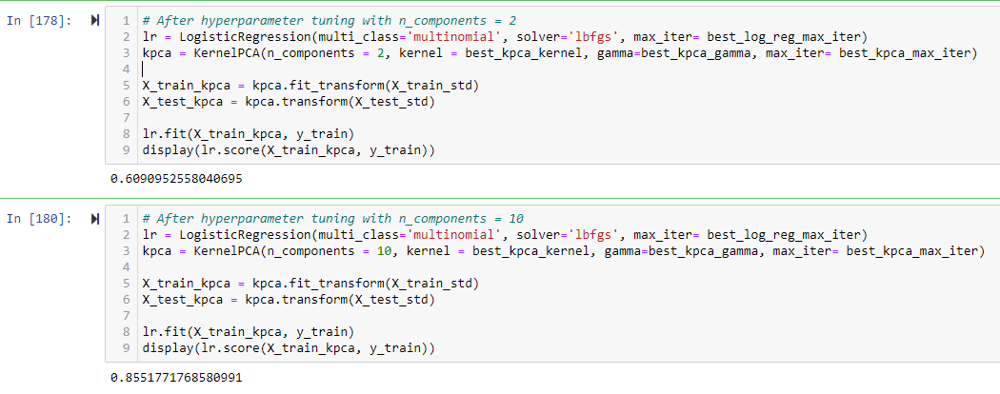

## Conclusion for Unsupervised model

Kernel PCA performs better than PCA for my dataset because dataset is non-linear.
PCA transformations are linear transformations and process of matrix decomposition into eigenvectors is a linear transformation. In other words, each principal component is a linear combination of the original wavelengths.

My required classification boundary are more complicated, which may look like a higher order polynomial, a non-linear function at any rate. Kernel PCA was developed in an effort to help with the classification of data whose decision boundaries are described by non-linear function. The idea is to go to a higher dimension space in which the decision boundary becomes linear which works for my case.

In [157]:
elapsed = timeit.default_timer() - start_time
elapsed

3269.9730194999997

In [158]:
elapsed/60

54.499550324999994